# Sentiment Analysis of Covid-19 Tweets - Module1


Group 10: Haolan Mai, Jiaqing Li, Yucong Li, Ruoxin Xu, Makie Maekawa, Bennett Cohen





























































































































Agenda
1. Project Description and Objectives
2. Data Description and Source
3. Data Loading and Inspection
4. Data Cleaning
5. Exploratory Data Analysis (Data Visualization) - Pandemic vs Post-Pandemic
6. Summary and Future Work

## Project Description and Objectives:



Overall Project Objective: To provide insights into public sentiment towards Covid-19 and how it has evolved over time, as well as to empower decision-makers with the ability to explore this information in a meaningful way.

Module 1: Data Collection and Exploration

Objectives:

 

*   To obtain the COVID-19 tweets dataset either through Kaggle and by using an API to scrape more recent data.
*   To describe the components of the data, and its limitations such as regional bias.
*   To perform data validation such as checking for missing data.
*   To perform data processing and cleaning steps to make sure the textual data is suitable for analysis.
*   To create visualizations that highlight interesting aspects of the data, such as the most common words in tweets.



Module 2: Model Development and Performance Evaluation

Objectives:

*   To perform sentiment analysis on the COVID-19 tweets dataset.

*   To select and apply appropriate models and methodologies to achieve the sentiment analysis goal.

*   To choose the best models based on performance and validation metrics.
*   To explain why the selected models were chosen and what their limitations are.

*   To tune the models to optimize their performance.

*   To evaluate the performance of the models and measure the results using appropriate metrics.


Module 3:Interactive Visualization and Conclusions

Objectives:

*   To create a high-level, concise, and coherent summary of the final model.

*   To provide an interactive tool such as a web visualization using Flask that allows the target audience (such as public health officials and policymakers who are interested in understanding public sentiment towards Covid-19) to explore the consequences of different decisions related to COVID-19.

*   To explain to the target audience how their decisions will impact the sentiment analysis results.

*   To communicate the effects of the decisions in a clear and understandable way to the target audience.



## Data Description and Source

In this project, we used Tweets data from Kaggle is collected using Twitter API and a Python script. These data were extracted by keywords of the hashtag(#covid19), and the query was run on a daily between 07/25/2020 and 08/29/2020 because of collecting a larger number of tweets samples.

The dataset 'covid2020.csv' consists of 13 columns and has 179108 rows of data.

user_name corresponds to user name

user_location corresponds to user location

user_description corresponds to user description

user_created corresponds to when the user was created

user_followers corresponds to number of followers of this user

user_friends corresponds to number of friends of this user

user_favourites corresponds to number of favorites for this user

user_verified corresponds to ‘ is the user verified’

date corresponds to tweet date

text corresponds to text of the tweet

hashtags corresponds to list of hashtags

source corresponds to source of the tweet

is_retweet corresponds to ‘ is the tweet a retweet’


Since we would like to do a 'pandemic vs post-pandemic analysis', we created a new dataset named 'covid2023.csv'. The 'covid2023.csv' is obtained via twitter API by modifying the data-collection script from the author of the original dataset.It has same amounts of columns as the 'covid2020.csv' does; in other words, it contains same type of information as the 'covid2020.csv' does and the most-recent tweets about covid-19 from 01/29/2023 to 02/08/2023. 

Source of data-collection script:

https://github.com/gabrielpreda/covid-19-tweets/blob/master/covid-19-tweets.ipynb



### Limitations of the 2020 Dataset

1. User Location/Regional Bias: People in some regions such as China do not have access to twitter(not considering using VPN), so we were not able to obatin opinions of covid-19 from these regions.

2. Time Zone Bias: Twitter users come from different time zones, and we collect data uniformly from one time zone, so it can be skewed.

3. Data Bias: The data we get on kaggle is too clean, so we have a limited amount of data cleaning to do.

4. Social Media Bias: We also know that a lot of people use social media, but they don't necessarily use twitter. For example, they might just use instagram, snapchat, etc.


### Limitations of the 2023 Dataset

1. All limitations of the 2020 Dataset

2. Because of the access level of the twitter developer account, we can only crawl the recent-7-day tweets so that the size of the data is much smaller compared to the 2020 dataset.

## Data Loading and Inspection

In [ ]:
#@title
import re
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import nltk
from nltk.sentiment import SentimentIntensityAnalyzer
from wordcloud import WordCloud
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize, RegexpTokenizer
nltk.download('stopwords')
nltk.download('vader_lexicon')



[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package vader_lexicon to /root/nltk_data...


True

In [ ]:
#@title
# load the dataset
df = pd.read_csv('covid2020.csv')
# load the new dataset
df_new = pd.read_csv('covid2023.csv')

In [ ]:
#@title
df.shape

(179108, 13)

In the 2020 Dataset, there are 179108 observations and 13 columns .


In [ ]:
#@title
df_new.shape

(24352, 13)

In the 2023 Dataset, there are 24352 observations and 13 columns.

In [ ]:
#@title
df.describe()

,user_followers,user_friends,user_favourites
count,1.791080e+05,179108.000000,1.791080e+05
mean,1.090555e+05,2121.701566,1.444411e+04
std,8.414670e+05,9162.553072,4.452270e+04
min,0.000000e+00,0.000000,0.000000e+00
25%,1.720000e+02,148.000000,2.060000e+02
50%,9.920000e+02,542.000000,1.791000e+03
75%,5.284000e+03,1725.250000,9.388000e+03
max,4.944256e+07,497363.000000,2.047197e+06


In [ ]:
#@title
df_new.describe()

,user_followers,user_friends,user_favourites
count,2.435200e+04,24352.000000,2.435200e+04
mean,7.077639e+04,2506.540654,2.089131e+04
std,7.151231e+05,18074.440797,5.682015e+04
min,0.000000e+00,0.000000,0.000000e+00
25%,2.080000e+02,127.000000,2.890000e+02
50%,1.125000e+03,577.000000,2.975000e+03
75%,3.892000e+03,1870.000000,1.443975e+04
max,1.621654e+07,477573.000000,1.342610e+06


The following is how the orignial dataset looks like, we can see there are 'NaN' 

In [ ]:
#@title
df.head(10)

,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,is_retweet
0,ᏉᎥ☻լꂅϮ,astroworld,wednesday addams as a disney princess keepin i...,2017-05-26 05:46:42,624,950,18775,False,2020-07-25 12:27:21,If I smelled the scent of hand sanitizers toda...,NaN,Twitter for iPhone,False
1,Tom Basile 🇺🇸,"New York, NY","Husband, Father, Columnist & Commentator. Auth...",2009-04-16 20:06:23,2253,1677,24,True,2020-07-25 12:27:17,Hey @Yankees @YankeesPR and @MLB - wouldn't it...,NaN,Twitter for Android,False
2,Time4fisticuffs,"Pewee Valley, KY",#Christian #Catholic #Conservative #Reagan #Re...,2009-02-28 18:57:41,9275,9525,7254,False,2020-07-25 12:27:14,@diane3443 @wdunlap @realDonaldTrump Trump nev...,['COVID19'],Twitter for Android,False
3,ethel mertz,Stuck in the Middle,#Browns #Indians #ClevelandProud #[]_[] #Cavs ...,2019-03-07 01:45:06,197,987,1488,False,2020-07-25 12:27:10,@brookbanktv The one gift #COVID19 has give me...,['COVID19'],Twitter for iPhone,False
4,DIPR-J&K,Jammu and Kashmir,🖊️Official Twitter handle of Department of Inf...,2017-02-12 06:45:15,101009,168,101,False,2020-07-25 12:27:08,25 July : Media Bulletin on Novel #CoronaVirus...,"['CoronaVirusUpdates', 'COVID19']",Twitter for Android,False
5,🎹 Franz Schubert,Новоро́ссия,🎼 #Новоро́ссия #Novorossiya #оставайсядома #S...,2018-03-19 16:29:52,1180,1071,1287,False,2020-07-25 12:27:06,#coronavirus #covid19 deaths continue to rise....,"['coronavirus', 'covid19']",Twitter Web App,False
6,hr bartender,"Gainesville, FL",Workplace tips and advice served up in a frien...,2008-08-12 18:19:49,79956,54810,3801,False,2020-07-25 12:27:03,How #COVID19 Will Change Work in General (and ...,"['COVID19', 'Recruiting']",Buffer,False
7,Derbyshire LPC,NaN,NaN,2012-02-03 18:08:10,608,355,95,False,2020-07-25 12:27:00,You now have to wear face coverings when out s...,NaN,TweetDeck,False
8,Prathamesh Bendre,NaN,"A poet, reiki practitioner and a student of law.",2015-04-25 08:15:41,25,29,18,False,2020-07-25 12:26:59,Praying for good health and recovery of @Chouh...,"['covid19', 'covidPositive']",Twitter for Android,False
9,Member of Christ 🇨🇳🇺🇸🇮🇳🇮🇩🇧🇷🇳🇬🇧🇩🇷🇺,👇🏻location at link below👇🏻,"Just as the body is one & has many members, & ...",2014-08-17 04:53:22,55201,34239,29802,False,2020-07-25 12:26:54,POPE AS GOD - Prophet Sadhu Sundar Selvaraj. W...,"['HurricaneHanna', 'COVID19']",Twitter for iPhone,False


In [ ]:
#@title
df_new.head(10)

,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,is_retweet
0,Alan2102z,NaN,Groucho Marxist\nEco-socialist\nRelentless critic,2014-01-01 23:57:08+00:00,590,712,1421,False,2023-02-08 20:58:26+00:00,"A ""hidden pandemic"" of #COVID19-induced #pneum...","['COVID19', 'pneumonia', 'corticosteroids', 'c...",Twitter Web App,False
1,Kris Dreemurr of the Pnictogen Wing (at Large),"Seattle, WA",I'm Kris. there's lots of Kris-es and I'm one ...,2022-04-08 20:56:20+00:00,188,127,26135,False,2023-02-08 20:56:24+00:00,"and it is any wonder that Western society, jam...",NaN,Twitter Web App,False
2,Recorder and Times,"Brockville, Ontario, Canada",News leader for Brockville and area since 1821...,2009-10-20 15:02:01+00:00,5560,1847,134,True,2023-02-08 20:56:17+00:00,Despite major #COVID19 indicators continuing t...,['COVID19'],Twitter Web App,False
3,Independent Pharmacy Alliance,NaN,"Independent Pharmacy Alliance, est. 1988, is a...",2015-04-10 14:41:36+00:00,779,756,1948,False,2023-02-08 20:55:52+00:00,FDA: Understanding At-Home OTC COVID-19 Antige...,"['pharmacy', 'independentpharmacy', 'COVID19']",Zoho Social,False
4,CDC,"Atlanta, GA",CDC's official Twitter source for daily credib...,2010-05-21 19:40:40+00:00,5418627,255,509,True,2023-02-08 20:54:50+00:00,A large #CDC vaccine safety study showed that ...,"['CDC', 'COVID19']",Sprout Social,False
5,Independent Pharmacy Alliance,NaN,"Independent Pharmacy Alliance, est. 1988, is a...",2015-04-10 14:41:36+00:00,779,756,1948,False,2023-02-08 20:54:11+00:00,#NY Maintain Patient Access to Essential Immun...,"['NY', 'pharmacy']",Zoho Social,False
6,Afterhours_Live,Hill Valley,#TLAVPirateAccounts,2016-10-05 12:40:12+00:00,4784,1280,3294,False,2023-02-08 20:53:46+00:00,Ukraine Tests Chemical Weapon On Russians &amp...,NaN,Restream.io,False
7,Independent Pharmacy Alliance,NaN,"Independent Pharmacy Alliance, est. 1988, is a...",2015-04-10 14:41:36+00:00,779,756,1948,False,2023-02-08 20:53:45+00:00,#FDA revised the Letters of Authorization for ...,"['FDA', 'Paxlovid', 'Lagevrio']",Zoho Social,False
8,Independent Pharmacy Alliance,NaN,"Independent Pharmacy Alliance, est. 1988, is a...",2015-04-10 14:41:36+00:00,779,756,1948,False,2023-02-08 20:53:24+00:00,The latest information about COVID-19 therapeu...,['Pharmacy'],Zoho Social,False
9,Stacey Alexander,Corner Brook,"Educator, lover of the outdoors, first wave co...",2012-04-20 00:24:22+00:00,297,440,5859,False,2023-02-08 20:52:00+00:00,Exactly. Most people think they’re not at ris...,NaN,Twitter for iPhone,False


In [ ]:
#@title
import numpy as np
def missing_data(data):
    total = data.isnull().sum()
    percent = (data.isnull().sum()/data.isnull().count()*100)
    tt = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
    types = []
    for col in data.columns:
        dtype = str(data[col].dtype)
        types.append(dtype)
    tt['Types'] = types
    return(np.transpose(tt))

In [ ]:
#@title
missing_data(df)

,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,is_retweet
Total,0,36771,10286,0,0,0,0,0,0,0,51334,77,0
Percent,0.0,20.530071,5.742904,0.0,0.0,0.0,0.0,0.0,0.0,0.0,28.66092,0.042991,0.0
Types,object,object,object,object,int64,int64,int64,bool,object,object,object,object,bool


Upon checking missing value for the 'covid2020.csv', we can see that, for example, the 'user_location' column has 36771 missing values. We will remove all the missing values in the dataset soon.

In [ ]:
#@title
missing_data(df_new)

,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,is_retweet
Total,0,6152,1256,0,0,0,0,0,0,0,6724,0,0
Percent,0.0,25.262812,5.157687,0.0,0.0,0.0,0.0,0.0,0.0,0.0,27.611695,0.0,0.0
Types,object,object,object,object,int64,int64,int64,bool,object,object,object,object,bool


Upon checking missing value for the 'covid2023.csv', we can see that, for example, the 'user_location' column has 6152 missing values. We will also remove all the missing values in the dataset soon.

In [ ]:
#@title
def unique_values(data):
    total = data.count()
    tt = pd.DataFrame(total)
    tt.columns = ['Total']
    uniques = []
    for col in data.columns:
        unique = data[col].nunique()
        uniques.append(unique)
    tt['Uniques'] = uniques
    return(np.transpose(tt))

In [ ]:
#@title
unique_values(df)

,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,is_retweet
Total,179108,142337,168822,179108,179108,179108,179108,179108,179108,179108,127774,179031,179108
Uniques,92276,26920,89200,93708,27694,11022,35259,2,136611,178683,52640,610,1


In [ ]:
#@title
unique_values(df_new)

,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,is_retweet
Total,24352,18200,23096,24352,24352,24352,24352,24352,24352,24352,17628,24352,24352
Uniques,10218,4079,9603,10284,4995,3537,7147,2,23596,23836,6903,269,1


Upon checking unique_values, we especially see that there are duplicate tweets for both datasets and we will remove them soon.

In [ ]:
#@title
def most_frequent_values(data):
    total = data.count()
    tt = pd.DataFrame(total)
    tt.columns = ['Total']
    items = []
    vals = []
    for col in data.columns:
        itm = data[col].value_counts().index[0]
        val = data[col].value_counts().values[0]
        items.append(itm)
        vals.append(val)
    tt['Most frequent item'] = items
    tt['Frequence'] = vals
    tt['Percent from total'] = np.round(vals / total * 100, 3)
    return(np.transpose(tt))

In [ ]:
#@title
most_frequent_values(df)

,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,is_retweet
Total,179108,142337,168822,179108,179108,179108,179108,179108,179108,179108,127774,179031,179108
Most frequent item,GlobalPandemic.NET,India,Breaking News & Critical Information to SURVIV...,2010-07-13 21:58:05,0,0,0,False,2020-08-06 16:00:00,"The incompetence of this administration, and t...",['COVID19'],Twitter Web App,False
Frequence,679,3741,679,679,1662,2839,5268,156013,26,13,37792,56891,179108
Percent from total,0.379,2.628,0.402,0.379,0.928,1.585,2.941,87.106,0.015,0.007,29.577,31.777,100.0


Upon checking most frequent values, we have some information such as that most covid tweets are from India users.

In [ ]:
#@title
most_frequent_values(df_new)

,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,is_retweet
Total,24352,18200,23096,24352,24352,24352,24352,24352,24352,24352,17628,24352,24352
Most frequent item,TheNecronomi.Com - #Horror #Podcast,Earth,Weekly #podcast analyzing #horror as social co...,2019-01-04 18:01:05+00:00,2121,3,0,False,2023-02-01 17:15:16+00:00,and I stand in solidarity with the global comm...,['COVID19'],Twitter Web App,False
Frequence,476,561,476,476,484,523,933,21993,7,18,4899,9226,24352
Percent from total,1.955,3.082,2.061,1.955,1.988,2.148,3.831,90.313,0.029,0.074,27.791,37.886,100.0


Insepcting the data, we can tell that the dataset actually still needs data cleaning, as there are duplicate tweets and missing user locations.

## Data Cleaning

For both 'covid2020.csv' and 'covid2023.csv':

1.  We first clean up the data by deleting the duplicate content.
2.  We will delete the line with "user_follower" =0 because we assume that the user does not have followers, and their contents will not spread. In other words, some people create these accounts just to complain, so it is not valuable.
3.  We will also delete N/A values
4.  We will reset the index after the steps above

5.  We preprocess the text column and clean up the text, and we will use the most common text cleaning methods covered.
We convert all letters to lowercase
We removed the url from the "text" column
We deleted the numbers in the "text" column to make the data cleaner
We deleted the punctuation, stop word, extra spaces, emoticons and Emojis in the " text" column
We eliminated the abbreviations to make the data cleaner


In [ ]:
#@title
# do some basic cleaning of the data
# drop duplicates
df = df.drop_duplicates(subset='text')
# drop the rows that user_followers =0
df = df[df['user_followers'] != 0]
# drop NA values
df = df.dropna()
# reset index
df = df.reset_index(drop=True)


In [ ]:
#@title
# do some basic cleaning of the data
# drop duplicates
df_new = df_new.drop_duplicates(subset='text')
# drop the rows that user_followers =0
df_new = df_new[df_new['user_followers'] != 0]
# drop NA values
df_new = df_new.dropna()
# reset index
df_new = df_new.reset_index(drop=True)

In [ ]:
#@title
# preprocess the text column and do text cleaning(most common methods are covered)
def preprocess_text(text):
    # convert to lowercase
    text = text.lower()
    
    # remove URLs
    text = re.sub(r"http\S+", "", text)
    
    # remove numbers
    text = re.sub(r"\d", "", text)
    
    # remove punctuation
    text = re.sub(r"[^\w\s]", "", text)
    
    # remove stopwords
    stop_words = set(stopwords.words("english"))
    tokens = word_tokenize(text)
    tokens = [word for word in tokens if word not in stop_words]
    
    # Removing extra spaces
    text = " ".join(tokens)
    text = re.sub(' +', ' ', text)
    
    # Removing Emojis
    text = re.sub(r'[^\x00-\x7F]+', '', text)
    
    # Removing emoticons
    text = re.sub(r':\w+:', '', text)
    
    # Removing Contractions
    text = re.sub(r"can\'t", "can not", text)
    text = re.sub(r"won\'t", "will not", text)
    text = re.sub(r"n\'t", " not", text)
    text = re.sub(r"\'re", " are", text)
    text = re.sub(r"\'s", " is", text)
    text = re.sub(r"\'d", " would", text)
    text = re.sub(r"\'ll", " will", text)
    text = re.sub(r"\'t", " not", text)
    text = re.sub(r"\'ve", " have", text)
    text = re.sub(r"\'m", " am", text)
    
    return text


In [ ]:
#@title
import nltk
nltk.download('punkt')
df["text"] = df["text"].apply(preprocess_text)

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


In [ ]:
#@title
import nltk
from nltk.corpus import stopwords
# preprocess the text column and do text cleaning(most common methods are covered)
def preprocess_text(text):
    # convert to lowercase
    text = text.lower()
    
    # remove URLs
    text = re.sub(r"http\S+", "", text)
    
    # remove numbers
    text = re.sub(r"\d", "", text)
    
    # remove punctuation
    text = re.sub(r"[^\w\s]", "", text)
    
    # remove stopwords
    stop_words = set(stopwords.words("english"))
    tokens = word_tokenize(text)
    tokens = [word for word in tokens if word not in stop_words]
    
    # Removing extra spaces
    text = " ".join(tokens)
    text = re.sub(' +', ' ', text)
    
    # Removing Emojis
    text = re.sub(r'[^\x00-\x7F]+', '', text)
    
    # Removing emoticons
    text = re.sub(r':\w+:', '', text)
    
    # Removing Contractions
    text = re.sub(r"can\'t", "can not", text)
    text = re.sub(r"won\'t", "will not", text)
    text = re.sub(r"n\'t", " not", text)
    text = re.sub(r"\'re", " are", text)
    text = re.sub(r"\'s", " is", text)
    text = re.sub(r"\'d", " would", text)
    text = re.sub(r"\'ll", " will", text)
    text = re.sub(r"\'t", " not", text)
    text = re.sub(r"\'ve", " have", text)
    text = re.sub(r"\'m", " am", text)
    
    return text
df_new["text"] = df_new["text"].apply(preprocess_text)

We also write a function to remove the emojis of 'user_name', 'user_location', 'user_description' columns for both datasets.

In [ ]:
#@title
def remove_emojis(column):
    return re.sub(r'[^\x00-\x7F]+', '', column)

df["user_name"] = df["user_name"].apply(remove_emojis)
df["user_location"] = df["user_location"].apply(remove_emojis)
df["user_description"] = df["user_description"].apply(remove_emojis)


In [ ]:
#@title
df_new["user_name"] = df_new["user_name"].apply(remove_emojis)
df_new["user_location"] = df_new["user_location"].apply(remove_emojis)
df_new["user_description"] = df_new["user_description"].apply(remove_emojis)


The cleaned 2020 dataset and cleaned 2023 dataset now look like the following:

In [ ]:
#@title
df.head(10)

,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,is_retweet
0,Time4fisticuffs,"Pewee Valley, KY",#Christian #Catholic #Conservative #Reagan #Re...,2009-02-28 18:57:41,9275,9525,7254,False,2020-07-25 12:27:14,diane wdunlap realdonaldtrump trump never clai...,['COVID19'],Twitter for Android,False
1,ethel mertz,Stuck in the Middle,#Browns #Indians #ClevelandProud #[]_[] #Cavs ...,2019-03-07 01:45:06,197,987,1488,False,2020-07-25 12:27:10,brookbanktv one gift covid give appreciation s...,['COVID19'],Twitter for iPhone,False
2,DIPR-J&K,Jammu and Kashmir,Official Twitter handle of Department of Infor...,2017-02-12 06:45:15,101009,168,101,False,2020-07-25 12:27:08,july media bulletin novel coronavirusupdates c...,"['CoronaVirusUpdates', 'COVID19']",Twitter for Android,False
3,Franz Schubert,,"# #Novorossiya # #STAYatHOME Polymath, compo...",2018-03-19 16:29:52,1180,1071,1287,False,2020-07-25 12:27:06,coronavirus covid deaths continue rise almost ...,"['coronavirus', 'covid19']",Twitter Web App,False
4,hr bartender,"Gainesville, FL",Workplace tips and advice served up in a frien...,2008-08-12 18:19:49,79956,54810,3801,False,2020-07-25 12:27:03,covid change work general recruiting specifica...,"['COVID19', 'Recruiting']",Buffer,False
5,Member of Christ,location at link below,"Just as the body is one & has many members, & ...",2014-08-17 04:53:22,55201,34239,29802,False,2020-07-25 12:26:54,pope god prophet sadhu sundar selvaraj watch h...,"['HurricaneHanna', 'COVID19']",Twitter for iPhone,False
6,Creativegms,"Dhaka,Bangladesh","I'm Motalib Mia, Logo -Logo Designer - Brandin...",2020-01-12 09:03:01,241,1694,8443,False,2020-07-25 12:26:50,order logo graphicdesigner logodesign logodesi...,"['logo', 'graphicdesigner', 'logodesign', 'log...",Twitter Web App,False
7,Africa Youth Advisory Board on DRR,Africa,Official account of the Africa Youth Advisory ...,2019-05-13 06:27:47,830,254,3692,False,2020-07-25 12:26:47,lets protect covid real numbers climbing fast ...,['COVID19'],Twitter Web App,False
8,Dimapur 24/7.,"Nagaland, India",strive to promote Truth with Integrity.\nhttps...,2019-11-11 12:02:27,274,32,378,False,2020-07-25 12:26:45,nagaland police covid awareness city tower jun...,"['Covid19', 'keepsocialdistance']",Twitter for Android,False
9,marc goovaerts,Brussels,"Progressive mind. Flemish. Into movies, politi...",2009-06-13 13:48:16,283,1432,1546,False,2020-07-25 12:26:44,second wave covid flandersback homework,"['COVID19', 'homework']",Twitter for Android,False


In [ ]:
#@title
df_new.head(10)

,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,is_retweet
0,Recorder and Times,"Brockville, Ontario, Canada",News leader for Brockville and area since 1821...,2009-10-20 15:02:01+00:00,5560,1847,134,True,2023-02-08 20:56:17+00:00,despite major covid indicators continuing go t...,['COVID19'],Twitter Web App,False
1,CDC,"Atlanta, GA",CDC's official Twitter source for daily credib...,2010-05-21 19:40:40+00:00,5418627,255,509,True,2023-02-08 20:54:50+00:00,large cdc vaccine safety study showed increase...,"['CDC', 'COVID19']",Sprout Social,False
2,Ashley McCully,Wherever the USMC needs us,Catholic. Texan. Marine Wife. Mama. Baylor Bea...,2009-08-12 18:44:23+00:00,6225,926,2575,False,2023-02-08 20:52:00+00:00,finally got talk mama praise jesus may god ble...,"['COVID19', 'prayer']",Twitter for iPhone,False
3,Wade Ferring,"Kentucky, USA",waiting for @SpeakerMcCarthy to release the 1...,2022-12-08 13:46:57+00:00,45,359,1222,False,2023-02-08 20:51:57+00:00,repjeffries million previous jobs biden democr...,"['Biden', 'Democrats', 'COVID19']",Twitter for iPhone,False
4,Justice Opportunity Liberty Politico,"Georgia, USA","Independent. #JOLPOL: Supporting #Justice, #O...",2012-09-02 21:22:33+00:00,1522,2140,131376,False,2023-02-08 20:50:54+00:00,jolpol house keyvote alert hr terminate requir...,"['JOLPOL', 'House', 'KeyVote', 'HR185', 'CDC']",Twitter Web App,False
5,Conservative Cat 1791,FLORIDA,I am a Conservative Cat.\n\nAnd I #FollowBack,2023-01-06 22:30:18+00:00,7,111,325,False,2023-02-08 20:50:06+00:00,usa war crimes country nordstreampipeline covi...,"['nordstreampipeline', 'COVID19', 'CIA']",Twitter Web App,False
6,Edward Goldstein,"Boston, Massachusetts","Massachusetts Eye and Ear, Harvard Medical Sch...",2020-04-29 07:15:31+00:00,74,7,75,False,2023-02-08 20:48:20+00:00,santepubliquefr influenza epidemic switching a...,['COVID19'],Twitter Web App,False
7,North Bay Parry Sound District Health Unit,Northern Ontario,Public Health | We are your lifetime partner i...,2010-10-08 15:30:06+00:00,2609,395,513,True,2023-02-08 20:47:54+00:00,hospital covid due virus individuals eligible ...,['COVID19'],Sprout Social,False
8,Karl Harrison,"British Columbia, Canada",Loving father & husband. Entrepreneur. Geologi...,2013-05-02 16:48:46+00:00,3339,1860,12041,False,2023-02-08 20:47:18+00:00,globeandmail fair camrclark concerned covid va...,"['COVID19', 'vaccinemandates', 'TrudeauMustGo']",Twitter for iPhone,False
9,YR Media,"Oakland, CA",Youth Radio is now #YRmedia a dynamic nationa...,2008-08-04 17:47:00+00:00,10811,1695,5768,True,2023-02-08 20:46:01+00:00,wellnesswednesday practicing good health welln...,"['WellnessWednesday', 'COVID19']",Sprout Social,False


In [ ]:
#@title
# check the missing values
print("Number of missing values:", df.isnull().sum().sum())

# check the distribution of tweet length
df["tweet_length"] = df["text"].apply(len)
print("\nStatistics of tweet length:")
print(df["tweet_length"].describe())


Number of missing values: 0

Statistics of tweet length:
count    98705.000000
mean        73.532121
std         17.068997
min          5.000000
25%         65.000000
50%         76.000000
75%         85.000000
max        127.000000
Name: tweet_length, dtype: float64


In [ ]:
#@title
# check the missing values
print("Number of missing values:", df_new.isnull().sum().sum())

# check the distribution of tweet length
df_new["tweet_length"] = df_new["text"].apply(len)
print("\nStatistics of tweet length:")
print(df_new["tweet_length"].describe())

Number of missing values: 0

Statistics of tweet length:
count    12695.000000
mean       129.022765
std         54.965367
min          5.000000
25%         85.000000
50%        128.000000
75%        176.000000
max        304.000000
Name: tweet_length, dtype: float64


Now we validate that missing values of two datasets are already removed.

## EDA(Data Visualization)- Pandemic vs Post-Pandemic

### Bar Plot of Most Common Words in Tweets

---



We would like to explore the frequency distribution of the most common words in the text body by displaying the top 20 most frequently used words. Unsurprisingly, the word “covid” was used far more frequently than any other word. The second and third most frequent words are “cases” and “coronavirus”.

Right bar plot is dataset of covid2020, and left side is dataset of covid2023. 12 out of 20 words are shown in both bar charts.

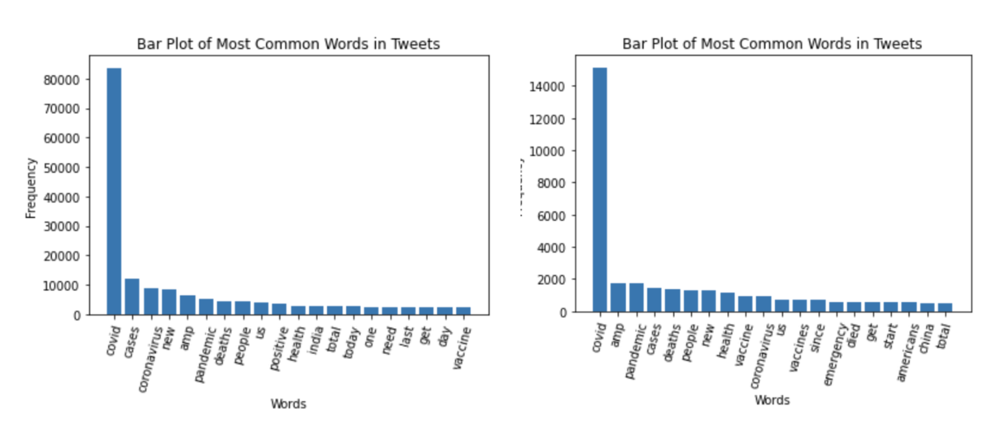

### Distribution of Length of Tweets

---

We create a histogram to see the characters of tweet lengths.
This is a left-skewed distribution, according to the image, because it is a distribution with the tail on the left. If the data distribution is skewed to the left, the mean is less than the median, which is usually less than the mode. In this image, most tweets are around 70-90 characters.


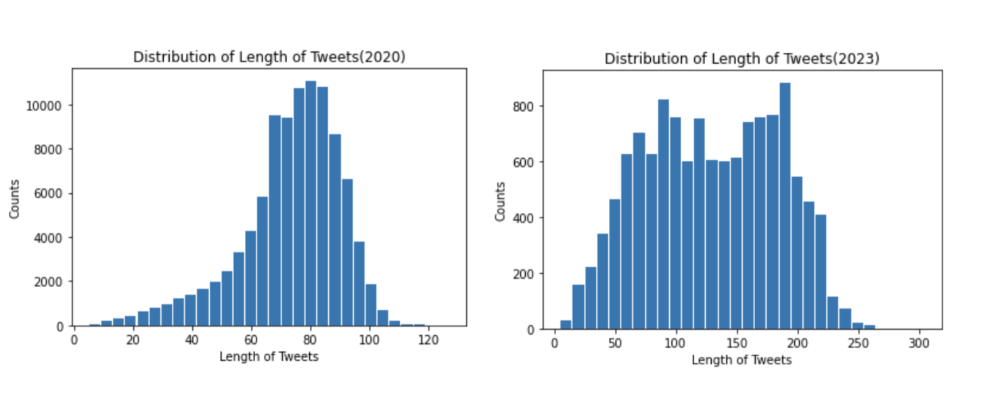

### User Location Analysis

---

Before creating the word cloud, we clean the "user_location" column. Then, we draw the word cloud for the "user_location" column after cleaning.
Based on the word cloud we have mapped, we can see that there are many regions that appear on the word cloud. The larger the word cloud displays, the higher the frequency of the word, and therefore the higher the frequency of the region in the data we obtain. We can clearly see that the users we collected are often distributed in some countries or cities, such as New York, Delhi, Washington DC, Mumbai, South Africa, United Kingdom, Australia, etc.


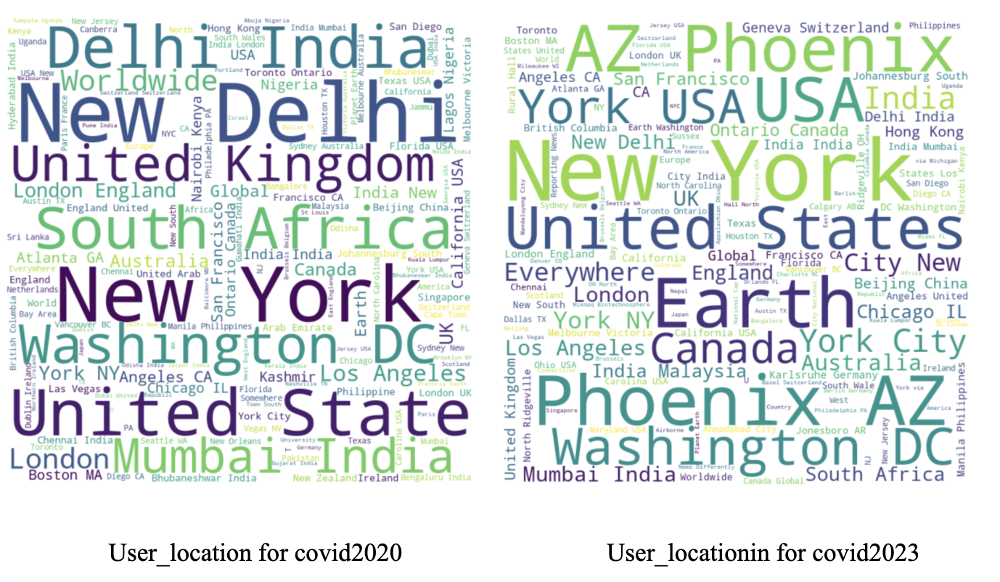

### Text WordClouds

---

Here, we want to find the common words in tweets about Covid-19 and investigate if there is a difference in keywords between 2020 and 2023 data. From the user location analysis above, we obtained some locations where users are concentrated. Without losing generality, we generated word clouds for different representative locations, such as India, the United States, the United Kingdom, Canada, South Africa, and Switzerland. 

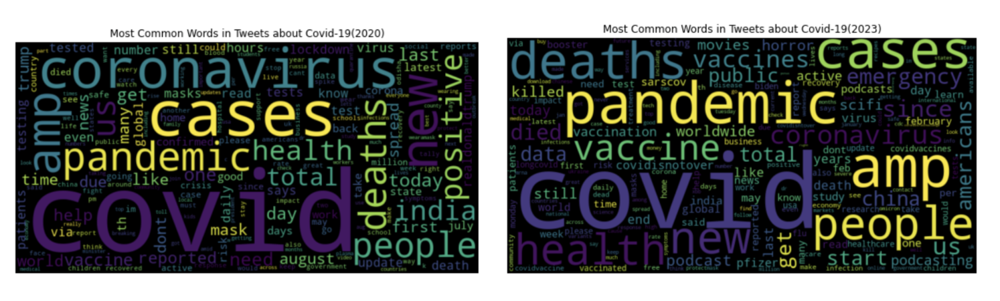

- U.S.

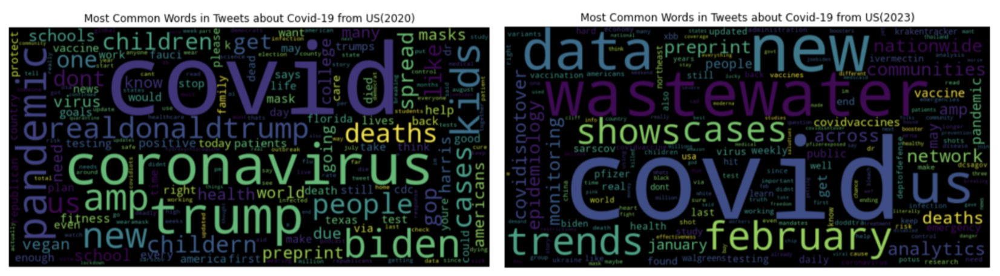

- UK and London

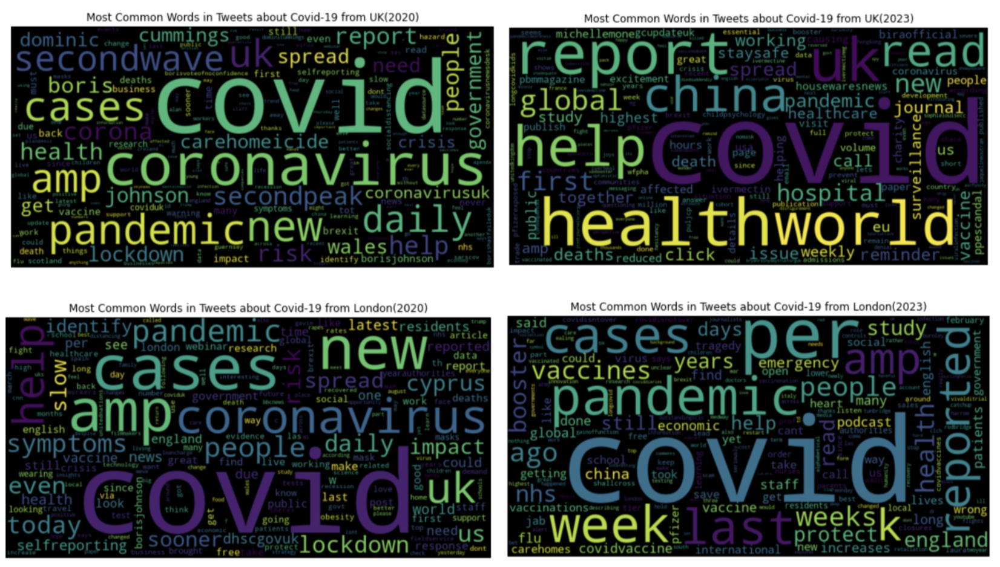

- Canada

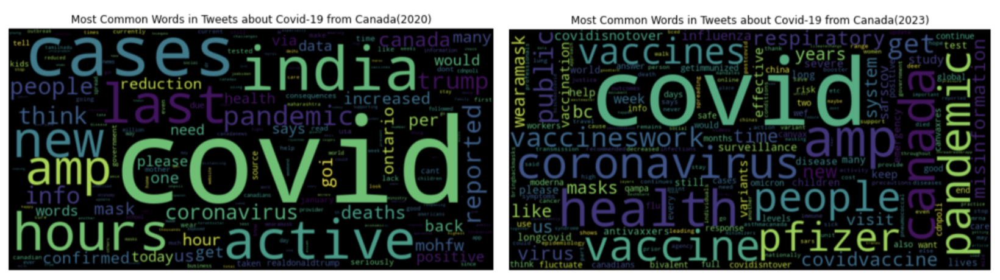

- South Africa

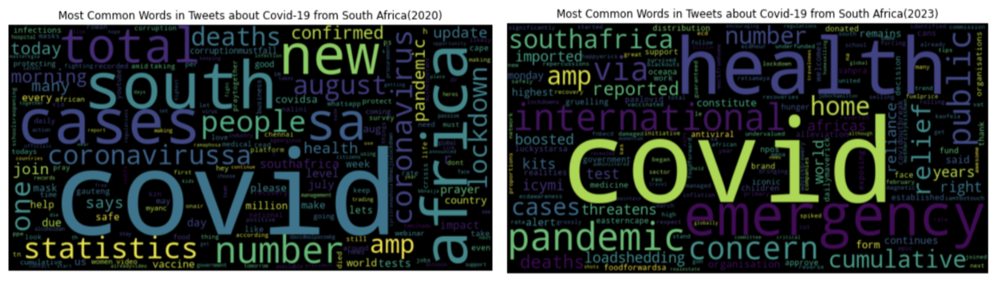

- Switzerland

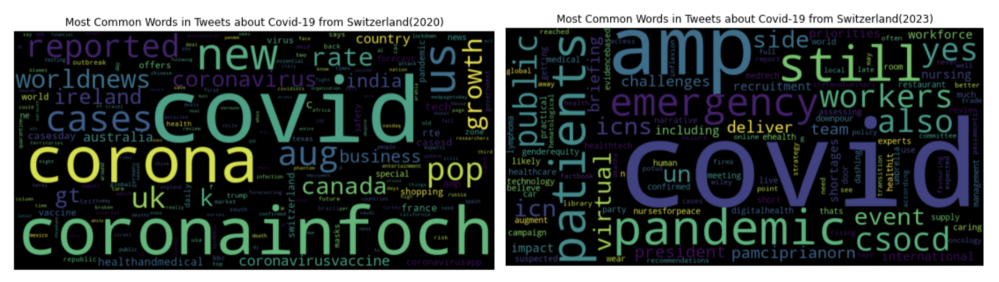

- India

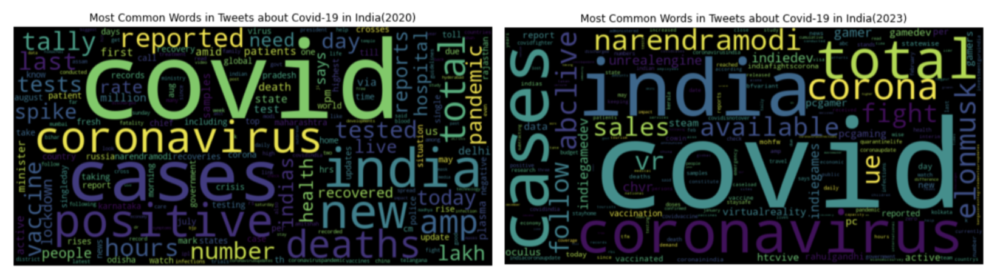

These plots show that the most frequent word in tweets published in these locations in both the 2020 and 2023 datasets is “Covid”. This states that the discussion of the covid has been very high among users in the past three years. This also gives us a positive signal that our 2020 and 2023 datasets are both COVID-related, ensuring that our future epidemic sentiment analysis will not go off-topic.

More specifically, although they are all related to COVID, a closer look brings that there are some light differences between the common words of 2020 and 2023. In 2020, in addition to “covid”, the more common words in these locations in tweets were “death”, “growth”, and “lockdown”. But in 2023, in addition to “covid”, the more common words in tweets become “vaccine” and “health”. From the changes in common words, we can predict that people’s attitude toward COVID-19 in 2020 was extremely negative, but now in 2023, due to the development of vaccines, people have become less anxious about the covid. 

### Hashtag Analysis

---

In this analysis, we are trying to investigate the number of hashtags per tweet and the most common hashtag. The number of hashtags per tweet is a simple way to determine whether or not the tweets we have collected are analytically valuable. Usually, tweets should have one to two hashtags to make the content of the tweet more specific.

Similar to the previous analysis, we plotted the number of hashtags per tweet and the common hashtags in 2020 and 2023 respectively.

The plot of the `hashtags_count` distribution shows us the frequency of the number of hashtags used in a tweet. And the WordClouds below express the most frequent words in hashtags.



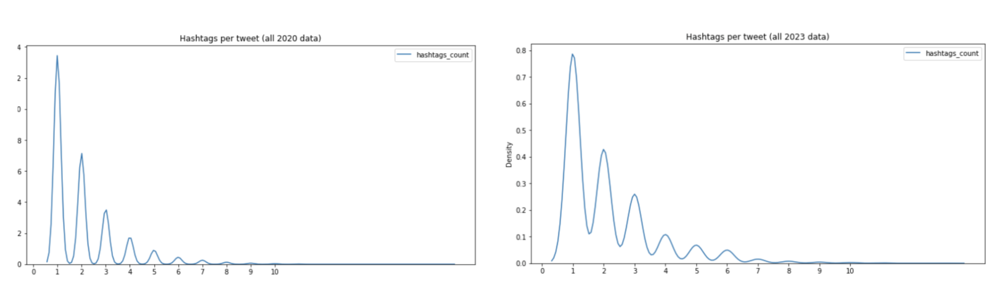

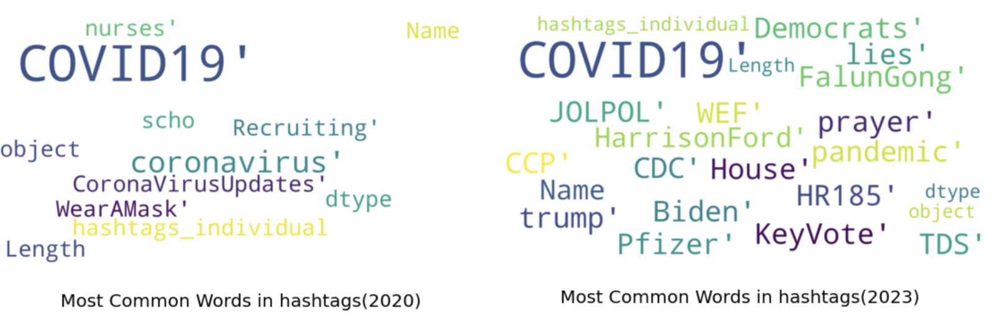

These plots exhibit that most of the tweets we collected in 2020 and 2023 contained one or two hashtags, and the most frequent hashtag was “COVID19”, proving once again that our datasets are analyzable. 

### Verified Account Analysis

---

#### Pie Chart of Verified vs. Non-verified Accounts

We are curious to see how many tweets about Covid19 are coming from credible sources. From the pie charts below, we could observe that in 2020, only 16.1% of the accounts are verified, and even lower percentage, 13.1% in 2023. The majority of accounts are not verified. Non-verified accounts tend to post more biased tweets since they could pretend to be an "anonymous stranger" online.

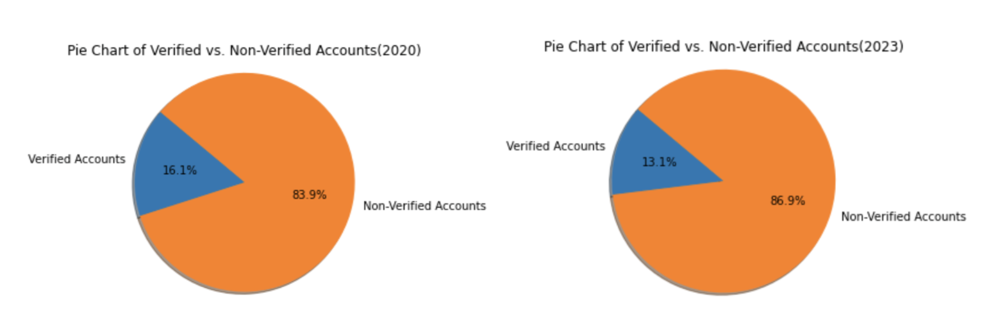

### Scatter plot to see the relationship between the number of followers and the number of friends

We created scatter plots to check if there is a relationship between the number of friends and the number of followers. By letting the x-axis represent the number of followers and the y-axis represent the number of friends, we could see that there does not seem to have a relationship between the two variables for either 2020 or 2023.

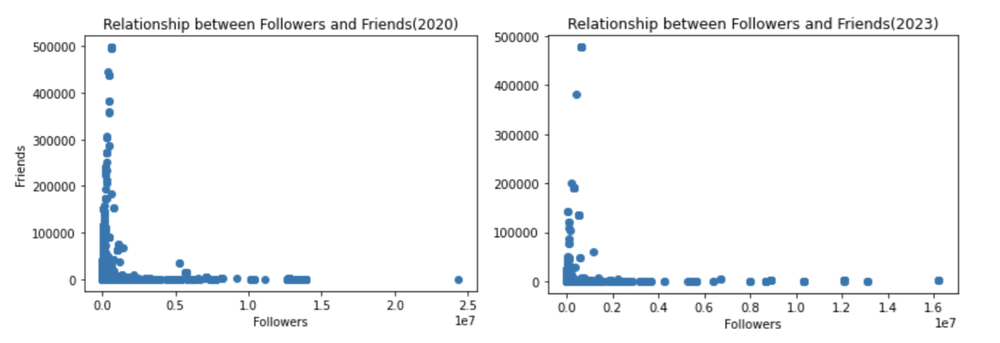

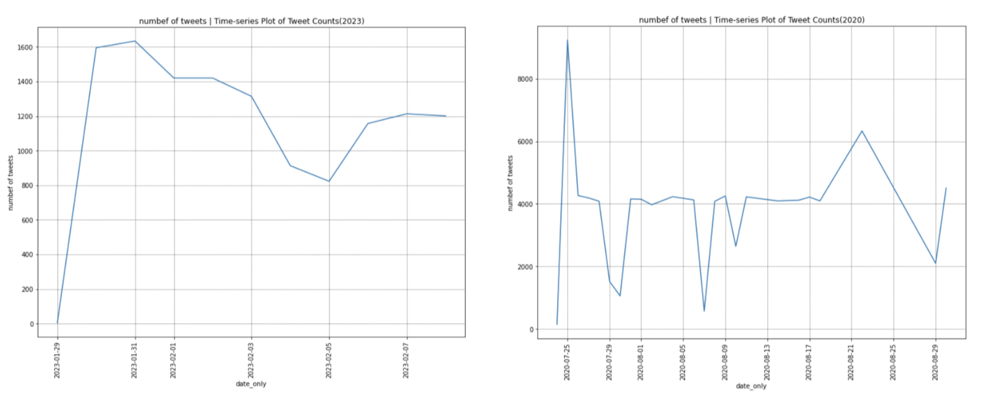

From checking the timeline posted by Centers for Disease Control and Prevention (CDC), we know that on 2020-7-16, "Many states, including California, Michigan, and Indiana postpone re-opening plans as COVID-19 case numbers rise." On that day, the U.S. reports a record of 75,600 new cases. On 2020-7-22, "the Department of Defense (DOD) and HHS reach a deal with Pfizer BioNTech for the delivery and distribution of 100 million doses of the Pfizer BioNTech COVID-19 vaccine candidate in December 2020, upon confirmation that the vaccine is safe and effective." On 2020-7-23, "CDC releases resources for school administrators, teachers, parents, guardians, and caregivers to help build appropriate public health strategies to slow the spread of COVID-19 in a school environment." There is no special events or festivals on 2020-7-25.

On 2020-8-19, "after CDC studies show that American Indians and Alaska Natives are among the racial and ethnic minority group at higher risk for severe COVID-19 outcomes, CDC provides more that $200 million in COVID-19 funding to Indian Country." On 2020-8-22, "a study published by the Journal of the American Medical Association calls into question the clinical benefits of the anti-viral drug Remdesivir being used to treat patients hospitalized with COVID-19." These events could be the reason for the second peak.

Because we only have ten days' record, the plot does not show any obvious peak. It only shows a lower point on 2023-2-5, but there does not seem to have any big event on that day globally.

## Summary and Future Work:


In this module, we use Kaggle's 2020 data and 2023 data obtained by ourselves to clean, analyze and compare them to help us conduct sentiment analysis later. We have repeatedly demonstrated the availability of our data. In the process, we discover that the most frequently tweeted word in the 2020 and 2023 data sets was "Covid." This indicates a very high level of user discussion on COVID-19 over the past three years, i.e. our 2020 and 2023 data sets are both COVID related, so this positive signal ensures that our future pandemic sentiment analysis stays on topic. Beyond that, we also found some subtle differences between common words used in 2020 and 2023. In 2020, other than "COVID-19," the more common words in tweets for those positions were "death," "growth," and "lockdown." But by 2023, in addition to "COVID-19," the more common words in tweets had become "vaccine" and "health." People are moving from fearing COVID-19 to fighting it with a vaccine. As attitudes improved and death rates dropped with the advent of vaccines, the topics and key words of discussion changed. Later, we also tried to investigate the number of hashtags per tweet and the most common hashtags. We speculate that tweets with one or two hashtags will be more specific in their content. At the same time, we also noticed that about 13% of users were unwilling to authenticate their Twitter account in either 2020 or 2023. Finally, we also identified the peaks and troughs of covid tweets in July and August 2020 and mid-February 2023, respectively, and we used the news at that time to guess the reasons for the peaks and troughs in comments.

While there are some limitations to our data, such as differences in user location and time zone, and the fact that Twitter does not cover all users and regions, ignoring these factors allows us to gain insight into public perceptions of Covid-19 and its evolution over time, and enable policymakers to explore this information in meaningful ways.

In the next step, we hope to perform sentiment analysis on COVID-19 tweet data set based on this, and select and apply appropriate models and methods to achieve the goal of sentiment analysis. In addition, we will select the best model based on performance and validation metrics, and explain why the models chosen and their limitations. Finally, we will adjust the model to optimize its performance as well as evaluate the performance of the model and measure the results using appropriate metrics.

## Appendix

In [ ]:
import re
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import nltk
from nltk.sentiment import SentimentIntensityAnalyzer
from wordcloud import WordCloud
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize, RegexpTokenizer
nltk.download('stopwords')
nltk.download('vader_lexicon')



[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package vader_lexicon to /root/nltk_data...


True

### Data Loading, Inspection and Cleaning

In [ ]:
import re
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import nltk
from nltk.sentiment import SentimentIntensityAnalyzer
from wordcloud import WordCloud
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize, RegexpTokenizer
nltk.download('stopwords')
nltk.download('vader_lexicon')


In [ ]:
# load the dataset
df = pd.read_csv('covid2020.csv')
# load the new dataset
df_new = pd.read_csv('covid2023.csv')
df.shape
df_new.shape
df.describe()
df_new.describe()
df.head(10)
df_new.head(10)


In [ ]:
import numpy as np
def missing_data(data):
    total = data.isnull().sum()
    percent = (data.isnull().sum()/data.isnull().count()*100)
    tt = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
    types = []
    for col in data.columns:
        dtype = str(data[col].dtype)
        types.append(dtype)
    tt['Types'] = types
    return(np.transpose(tt))
missing_data(df)
missing_data(df_new)

def unique_values(data):
    total = data.count()
    tt = pd.DataFrame(total)
    tt.columns = ['Total']
    uniques = []
    for col in data.columns:
        unique = data[col].nunique()
        uniques.append(unique)
    tt['Uniques'] = uniques
    return(np.transpose(tt))

unique_values(df)
unique_values(df_new)

def most_frequent_values(data):
    total = data.count()
    tt = pd.DataFrame(total)
    tt.columns = ['Total']
    items = []
    vals = []
    for col in data.columns:
        itm = data[col].value_counts().index[0]
        val = data[col].value_counts().values[0]
        items.append(itm)
        vals.append(val)
    tt['Most frequent item'] = items
    tt['Frequence'] = vals
    tt['Percent from total'] = np.round(vals / total * 100, 3)
    return(np.transpose(tt))

most_frequent_values(df)
most_frequent_values(df_new)




In [ ]:
# do some basic cleaning of the data
# drop duplicates
df = df.drop_duplicates(subset='text')
# drop the rows that user_followers =0
df = df[df['user_followers'] != 0]
# drop NA values
df = df.dropna()
# reset index
df = df.reset_index(drop=True)

# do some basic cleaning of the data
# drop duplicates
df_new = df_new.drop_duplicates(subset='text')
# drop the rows that user_followers =0
df_new = df_new[df_new['user_followers'] != 0]
# drop NA values
df_new = df_new.dropna()
# reset index
df_new = df_new.reset_index(drop=True)


# preprocess the text column and do text cleaning(most common methods are covered)
def preprocess_text(text):
    # convert to lowercase
    text = text.lower()
    
    # remove URLs
    text = re.sub(r"http\S+", "", text)
    
    # remove numbers
    text = re.sub(r"\d", "", text)
    
    # remove punctuation
    text = re.sub(r"[^\w\s]", "", text)
    
    # remove stopwords
    stop_words = set(stopwords.words("english"))
    tokens = word_tokenize(text)
    tokens = [word for word in tokens if word not in stop_words]
    
    # Removing extra spaces
    text = " ".join(tokens)
    text = re.sub(' +', ' ', text)
    
    # Removing Emojis
    text = re.sub(r'[^\x00-\x7F]+', '', text)
    
    # Removing emoticons
    text = re.sub(r':\w+:', '', text)
    
    # Removing Contractions
    text = re.sub(r"can\'t", "can not", text)
    text = re.sub(r"won\'t", "will not", text)
    text = re.sub(r"n\'t", " not", text)
    text = re.sub(r"\'re", " are", text)
    text = re.sub(r"\'s", " is", text)
    text = re.sub(r"\'d", " would", text)
    text = re.sub(r"\'ll", " will", text)
    text = re.sub(r"\'t", " not", text)
    text = re.sub(r"\'ve", " have", text)
    text = re.sub(r"\'m", " am", text)
    
    return text


import nltk
nltk.download('punkt')
df["text"] = df["text"].apply(preprocess_text)


import nltk
from nltk.corpus import stopwords
# preprocess the text column and do text cleaning(most common methods are covered)
def preprocess_text(text):
    # convert to lowercase
    text = text.lower()
    
    # remove URLs
    text = re.sub(r"http\S+", "", text)
    
    # remove numbers
    text = re.sub(r"\d", "", text)
    
    # remove punctuation
    text = re.sub(r"[^\w\s]", "", text)
    
    # remove stopwords
    stop_words = set(stopwords.words("english"))
    tokens = word_tokenize(text)
    tokens = [word for word in tokens if word not in stop_words]
    
    # Removing extra spaces
    text = " ".join(tokens)
    text = re.sub(' +', ' ', text)
    
    # Removing Emojis
    text = re.sub(r'[^\x00-\x7F]+', '', text)
    
    # Removing emoticons
    text = re.sub(r':\w+:', '', text)
    
    # Removing Contractions
    text = re.sub(r"can\'t", "can not", text)
    text = re.sub(r"won\'t", "will not", text)
    text = re.sub(r"n\'t", " not", text)
    text = re.sub(r"\'re", " are", text)
    text = re.sub(r"\'s", " is", text)
    text = re.sub(r"\'d", " would", text)
    text = re.sub(r"\'ll", " will", text)
    text = re.sub(r"\'t", " not", text)
    text = re.sub(r"\'ve", " have", text)
    text = re.sub(r"\'m", " am", text)
    
    return text
df_new["text"] = df_new["text"].apply(preprocess_text)



def remove_emojis(column):
    return re.sub(r'[^\x00-\x7F]+', '', column)

df["user_name"] = df["user_name"].apply(remove_emojis)
df["user_location"] = df["user_location"].apply(remove_emojis)
df["user_description"] = df["user_description"].apply(remove_emojis)


df_new["user_name"] = df_new["user_name"].apply(remove_emojis)
df_new["user_location"] = df_new["user_location"].apply(remove_emojis)
df_new["user_description"] = df_new["user_description"].apply(remove_emojis)


df.head(10)
df_new.head(10)


# check the missing values
print("Number of missing values:", df.isnull().sum().sum())

# check the distribution of tweet length
df["tweet_length"] = df["text"].apply(len)
print("\nStatistics of tweet length:")
print(df["tweet_length"].describe())


# check the missing values
print("Number of missing values:", df_new.isnull().sum().sum())

# check the distribution of tweet length
df_new["tweet_length"] = df_new["text"].apply(len)
print("\nStatistics of tweet length:")
print(df_new["tweet_length"].describe())



### Bar Plot of Most Common Words in Tweets


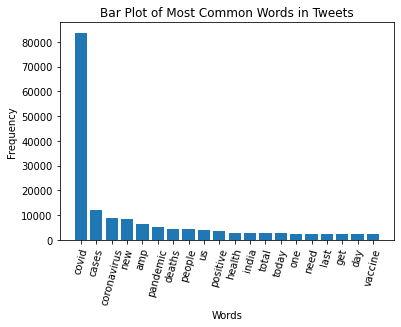

In [ ]:
from collections import Counter
import matplotlib.pyplot as plt

text = " ".join(df['text'])
words = text.split()
words_counter = Counter(words)
most_common_words = words_counter.most_common(20)

words = [word[0] for word in most_common_words]
counts = [word[1] for word in most_common_words]

plt.bar(words, counts)
plt.xlabel('Words')
plt.ylabel('Frequency')
plt.title('Bar Plot of Most Common Words in Tweets')
plt.xticks(rotation=75)
plt.show()

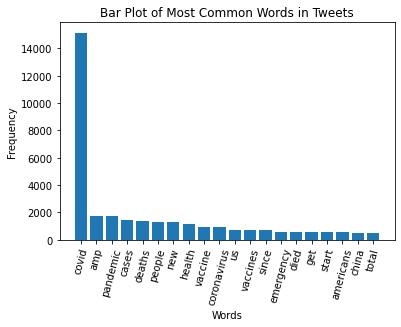

In [ ]:
text = " ".join(df_new['text'])
words = text.split()
words_counter = Counter(words)
most_common_words = words_counter.most_common(20)

words = [word[0] for word in most_common_words]
counts = [word[1] for word in most_common_words]

plt.bar(words, counts)
plt.xlabel('Words')
plt.ylabel('Frequency')
plt.title('Bar Plot of Most Common Words in Tweets')
plt.xticks(rotation=75)
plt.show()

We would like to explore the frequency distribution of the most common words in the text body by displaying the top 20 most frequently used words. Unsurprisingly, **the word “covid” was used far more frequently than any other word. The second and third most frequent words are “cases” and “coronavirus”.**

### Distribution of Length of Tweets

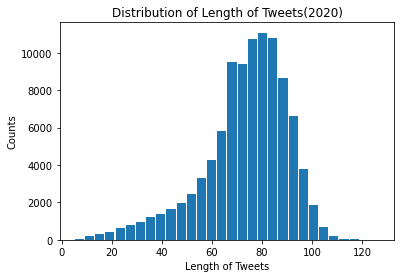

In [ ]:
# Create a histogram plot to see the distribution of the length of tweets
df['text_length'] = df['text'].apply(len)
df['text_length'].plot.hist(bins=30, rwidth=0.9)
plt.xlabel('Length of Tweets')
plt.ylabel('Counts')
plt.title('Distribution of Length of Tweets(2020)')
plt.show()



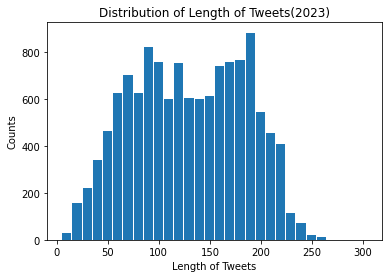

In [ ]:
# Create a histogram plot to see the distribution of the length of tweets
df_new['text_length'] = df_new['text'].apply(len)
df_new['text_length'].plot.hist(bins=30, rwidth=0.9)
plt.xlabel('Length of Tweets')
plt.ylabel('Counts')
plt.title('Distribution of Length of Tweets(2023)')
plt.show()

We create a histogram to see the characters of tweet lengths.
This is a left-skewed distribution, according to the image, because it is a distribution with the tail on the left. If the data distribution is skewed to the left, the mean is less than the median, which is usually less than the mode. **In this image, most tweets are around 70-90 characters.**


In [ ]:
def plot_count(feature, title, df, size=1, ordered=True):
    f, ax = plt.subplots(1,1, figsize=(4*size,4))
    total = float(len(df))
    if ordered:
        g = sns.countplot(df[feature], order = df[feature].value_counts().index[:20], palette='Set3')
    else:
        g = sns.countplot(df[feature], palette='Set3')
    g.set_title("Number and percentage of {}".format(title))
    if(size > 2):
        plt.xticks(rotation=90, size=8)
    for p in ax.patches:
        height = p.get_height()
        ax.text(p.get_x()+p.get_width()/2.,
                height + 3,
                '{:1.2f}%'.format(100*height/total),
                ha="center") 
    plt.show()    

In [ ]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

### User Location Analysis

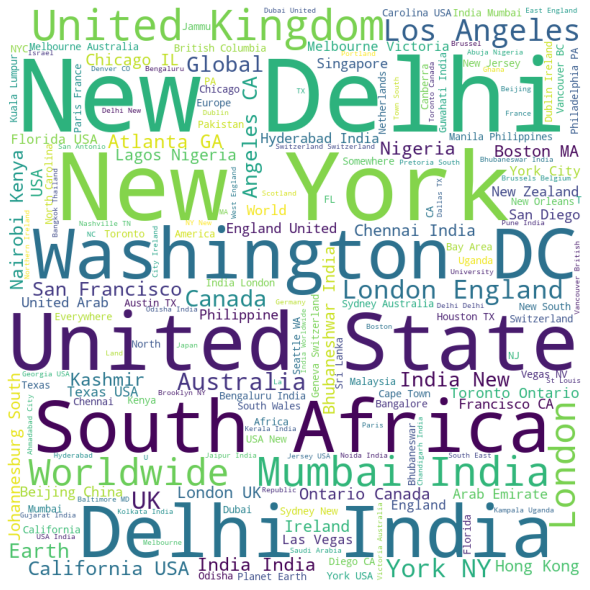

In [ ]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud
import re

# Clean the user_location column
df['user_location'] = df['user_location'].str.replace('[^\w\s]','')
df = df[df['user_location'].notna()]
text = " ".join(df['user_location'].values)

# Create the word cloud
wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white', 
                stopwords = None, 
                min_font_size = 10).generate(text)

# Plot the word cloud
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show() 


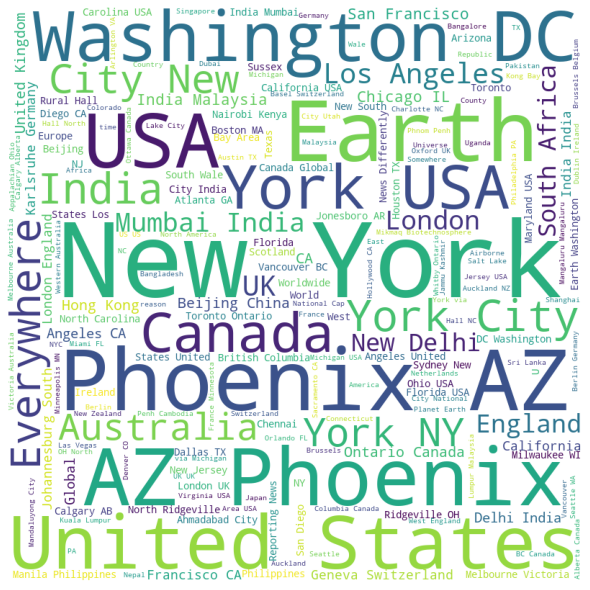

In [ ]:
# Clean the user_location column
df_new['user_location'] = df_new['user_location'].str.replace('[^\w\s]','')
df_new = df_new[df_new['user_location'].notna()]
text = " ".join(df_new['user_location'].values)

# Create the word cloud
wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white', 
                stopwords = None, 
                min_font_size = 10).generate(text)

# Plot the word cloud
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show() 

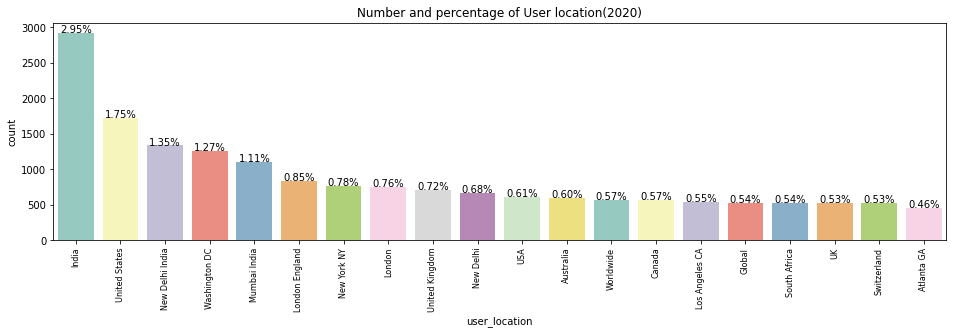

In [ ]:
plot_count("user_location", "User location(2020)", df,4)

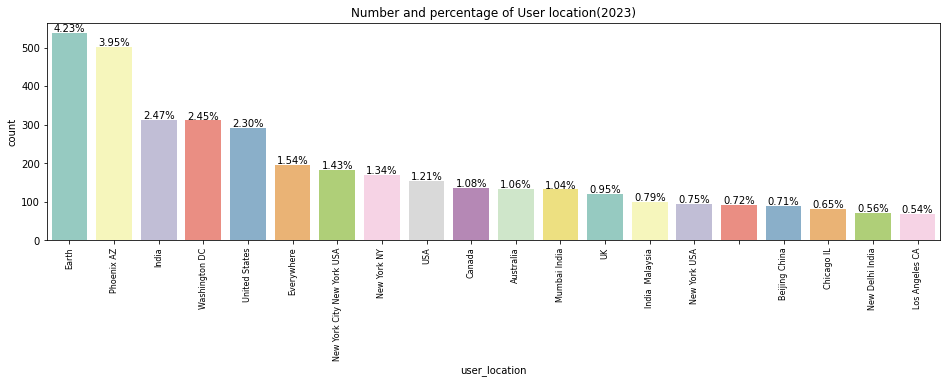

In [ ]:
plot_count("user_location", "User location(2023)", df_new,4)

Before creating the word cloud, we clean the "user_location" column. Then, we draw the word cloud for the "user_location" column after cleaning.
Based on the word cloud we have mapped, we can see that there are many regions that appear on the word cloud. The larger the word cloud displays, the higher the frequency of the word, and therefore the higher the frequency of the region in the data we obtain. **We can clearly see that the users we collected are often distributed in some countries or cities, such as New York, Delhi, Washington DC, Mumbai, South Africa, United Kingdom, Australia, etc**


### Text WordClouds

Here, we want to find the common words in tweets about Covid-19 and investigate if there is a difference in keywords between 2020 and 2023 data. From the user location analysis above, we obtained some locations where users are concentrated. Without losing generality, we generated word clouds for different representative locations, such as India, the United States, the United Kingdom, Canada, South Africa, and Switzerland. 

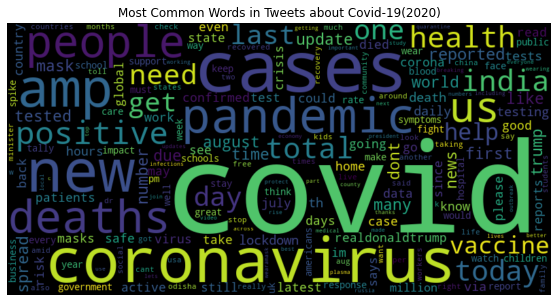

In [ ]:
from wordcloud import WordCloud

# Remove stop words and calculate the frequency of the words
stop_words = nltk.corpus.stopwords.words('english')
all_words = ' '.join(df['text'].tolist())
words = nltk.word_tokenize(all_words)
words = [word.lower() for word in words if word.isalpha() and word.lower() not in stop_words]
fdist = nltk.FreqDist(words)

# Plot the word cloud of the most common words
wordcloud = WordCloud(width=800, height=400).generate_from_frequencies(fdist)
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.title('Most Common Words in Tweets about Covid-19(2020)')
plt.show()

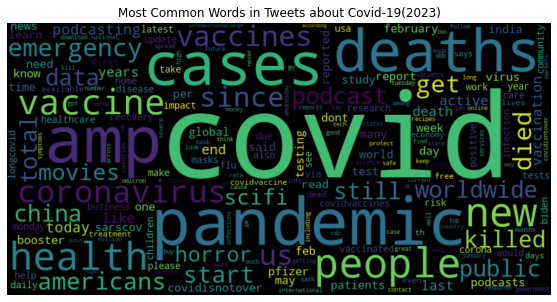

In [ ]:
# Remove stop words and calculate the frequency of the words
stop_words = nltk.corpus.stopwords.words('english')
all_words = ' '.join(df_new['text'].tolist())
words = nltk.word_tokenize(all_words)
words = [word.lower() for word in words if word.isalpha() and word.lower() not in stop_words]
fdist = nltk.FreqDist(words)

# Plot the word cloud of the most common words
wordcloud = WordCloud(width=800, height=400).generate_from_frequencies(fdist)
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.title('Most Common Words in Tweets about Covid-19(2023)')
plt.show()

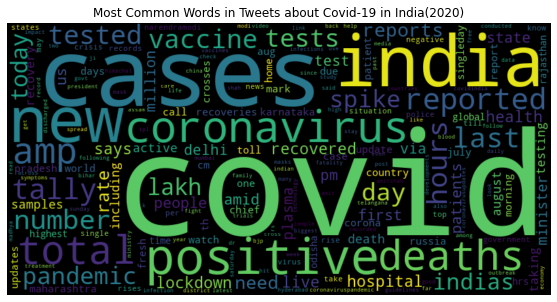

In [ ]:
india_df = df.loc[df.user_location=="India"]
# Remove stop words and calculate the frequency of the words
stop_words = nltk.corpus.stopwords.words('english')
all_words = ' '.join(india_df['text'].tolist())
words = nltk.word_tokenize(all_words)
words = [word.lower() for word in words if word.isalpha() and word.lower() not in stop_words]
fdist = nltk.FreqDist(words)

# Plot the word cloud of the most common words
wordcloud = WordCloud(width=800, height=400).generate_from_frequencies(fdist)
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.title('Most Common Words in Tweets about Covid-19 in India(2020)')
plt.show()

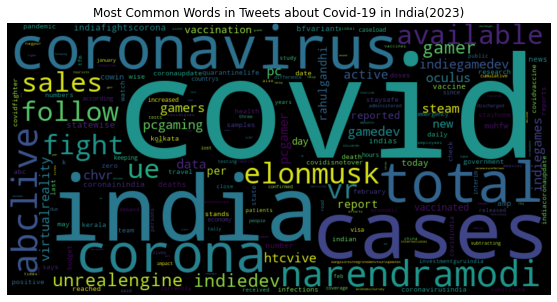

In [ ]:
india_df_new = df_new.loc[df_new.user_location=="India"]
# Remove stop words and calculate the frequency of the words
stop_words = nltk.corpus.stopwords.words('english')
all_words = ' '.join(india_df_new['text'].tolist())
words = nltk.word_tokenize(all_words)
words = [word.lower() for word in words if word.isalpha() and word.lower() not in stop_words]
fdist = nltk.FreqDist(words)

# Plot the word cloud of the most common words
wordcloud = WordCloud(width=800, height=400).generate_from_frequencies(fdist)
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.title('Most Common Words in Tweets about Covid-19 in India(2023)')
plt.show()

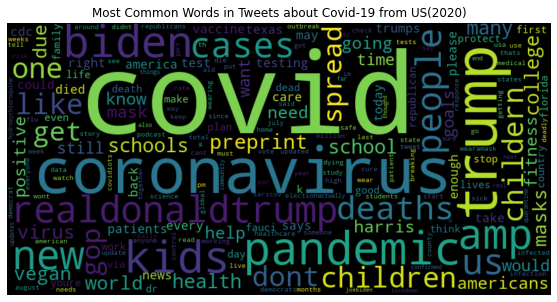

In [ ]:
us_df = df.loc[df.user_location=="United States"]
# Remove stop words and calculate the frequency of the words
stop_words = nltk.corpus.stopwords.words('english')
all_words = ' '.join(us_df['text'].tolist())
words = nltk.word_tokenize(all_words)
words = [word.lower() for word in words if word.isalpha() and word.lower() not in stop_words]
fdist = nltk.FreqDist(words)

# Plot the word cloud of the most common words
wordcloud = WordCloud(width=800, height=400).generate_from_frequencies(fdist)
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.title('Most Common Words in Tweets about Covid-19 from US(2020)')
plt.show()

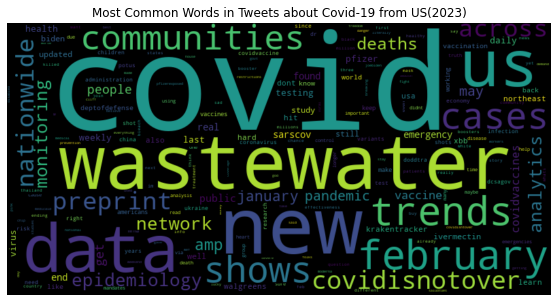

In [ ]:
us_df_new = df_new.loc[df_new.user_location=="United States"]
# Remove stop words and calculate the frequency of the words
stop_words = nltk.corpus.stopwords.words('english')
all_words = ' '.join(us_df_new['text'].tolist())
words = nltk.word_tokenize(all_words)
words = [word.lower() for word in words if word.isalpha() and word.lower() not in stop_words]
fdist = nltk.FreqDist(words)

# Plot the word cloud of the most common words
wordcloud = WordCloud(width=800, height=400).generate_from_frequencies(fdist)
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.title('Most Common Words in Tweets about Covid-19 from US(2023)')
plt.show()

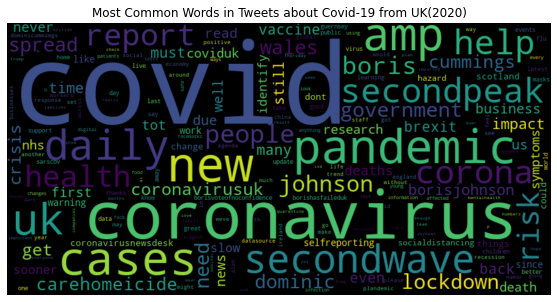

In [ ]:
uk_df = df.loc[df.user_location=="United Kingdom"]
# Remove stop words and calculate the frequency of the words
stop_words = nltk.corpus.stopwords.words('english')
all_words = ' '.join(uk_df['text'].tolist())
words = nltk.word_tokenize(all_words)
words = [word.lower() for word in words if word.isalpha() and word.lower() not in stop_words]
fdist = nltk.FreqDist(words)

# Plot the word cloud of the most common words
wordcloud = WordCloud(width=800, height=400).generate_from_frequencies(fdist)
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.title('Most Common Words in Tweets about Covid-19 from UK(2020)')
plt.show()

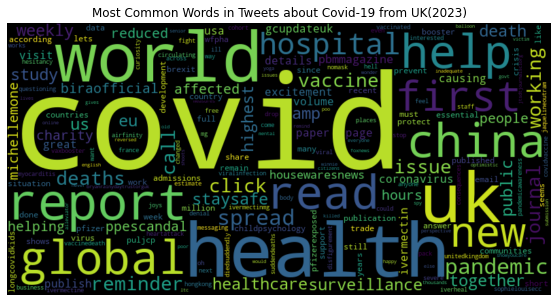

In [ ]:
uk_df_new = df_new.loc[df_new.user_location=="United Kingdom"]
# Remove stop words and calculate the frequency of the words
stop_words = nltk.corpus.stopwords.words('english')
all_words = ' '.join(uk_df_new['text'].tolist())
words = nltk.word_tokenize(all_words)
words = [word.lower() for word in words if word.isalpha() and word.lower() not in stop_words]
fdist = nltk.FreqDist(words)

# Plot the word cloud of the most common words
wordcloud = WordCloud(width=800, height=400).generate_from_frequencies(fdist)
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.title('Most Common Words in Tweets about Covid-19 from UK(2023)')
plt.show()

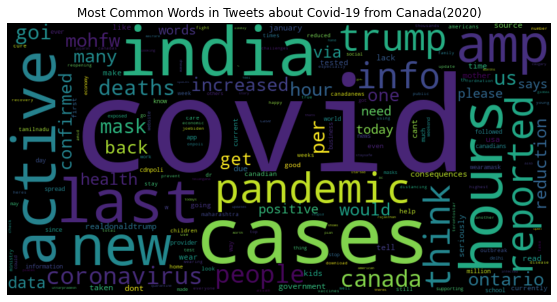

In [ ]:
canada_df = df.loc[df.user_location=="Canada"]
# Remove stop words and calculate the frequency of the words
stop_words = nltk.corpus.stopwords.words('english')
all_words = ' '.join(canada_df['text'].tolist())
words = nltk.word_tokenize(all_words)
words = [word.lower() for word in words if word.isalpha() and word.lower() not in stop_words]
fdist = nltk.FreqDist(words)

# Plot the word cloud of the most common words
wordcloud = WordCloud(width=800, height=400).generate_from_frequencies(fdist)
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.title('Most Common Words in Tweets about Covid-19 from Canada(2020)')
plt.show()

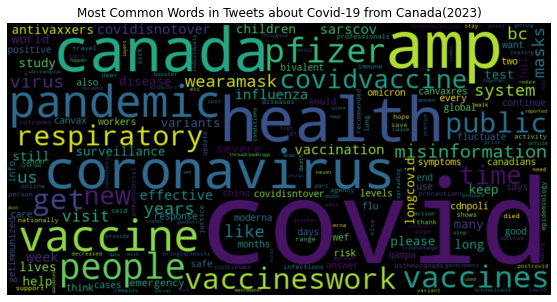

In [ ]:
canada_df_new = df_new.loc[df_new.user_location=="Canada"]
# Remove stop words and calculate the frequency of the words
stop_words = nltk.corpus.stopwords.words('english')
all_words = ' '.join(canada_df_new['text'].tolist())
words = nltk.word_tokenize(all_words)
words = [word.lower() for word in words if word.isalpha() and word.lower() not in stop_words]
fdist = nltk.FreqDist(words)

# Plot the word cloud of the most common words
wordcloud = WordCloud(width=800, height=400).generate_from_frequencies(fdist)
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.title('Most Common Words in Tweets about Covid-19 from Canada(2023)')
plt.show()

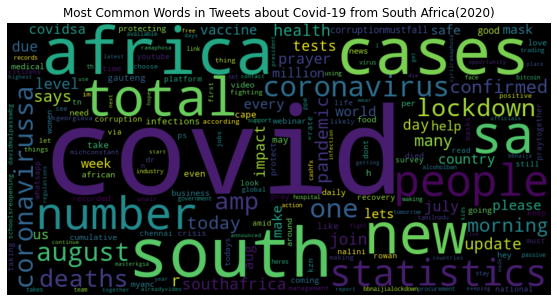

In [ ]:
sa_df = df.loc[df.user_location=="South Africa"]
# Remove stop words and calculate the frequency of the words
stop_words = nltk.corpus.stopwords.words('english')
all_words = ' '.join(sa_df['text'].tolist())
words = nltk.word_tokenize(all_words)
words = [word.lower() for word in words if word.isalpha() and word.lower() not in stop_words]
fdist = nltk.FreqDist(words)

# Plot the word cloud of the most common words
wordcloud = WordCloud(width=800, height=400).generate_from_frequencies(fdist)
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.title('Most Common Words in Tweets about Covid-19 from South Africa(2020)')
plt.show()

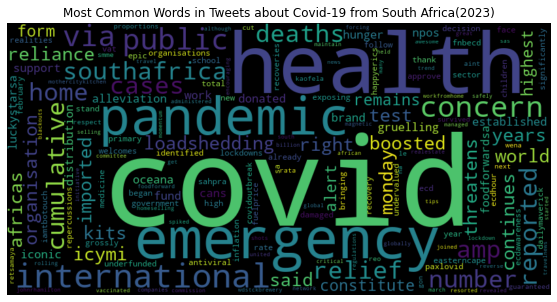

In [ ]:
sa_df_new = df_new.loc[df_new.user_location=="South Africa"]
# Remove stop words and calculate the frequency of the words
stop_words = nltk.corpus.stopwords.words('english')
all_words = ' '.join(sa_df_new['text'].tolist())
words = nltk.word_tokenize(all_words)
words = [word.lower() for word in words if word.isalpha() and word.lower() not in stop_words]
fdist = nltk.FreqDist(words)

# Plot the word cloud of the most common words
wordcloud = WordCloud(width=800, height=400).generate_from_frequencies(fdist)
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.title('Most Common Words in Tweets about Covid-19 from South Africa(2023)')
plt.show()

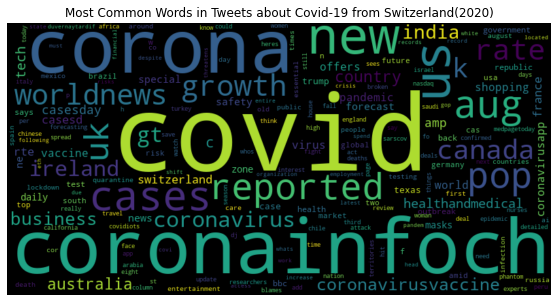

In [ ]:
che_df = df.loc[df.user_location=="Switzerland"]
# Remove stop words and calculate the frequency of the words
stop_words = nltk.corpus.stopwords.words('english')
all_words = ' '.join(che_df['text'].tolist())
words = nltk.word_tokenize(all_words)
words = [word.lower() for word in words if word.isalpha() and word.lower() not in stop_words]
fdist = nltk.FreqDist(words)

# Plot the word cloud of the most common words
wordcloud = WordCloud(width=800, height=400).generate_from_frequencies(fdist)
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.title('Most Common Words in Tweets about Covid-19 from Switzerland(2020)')
plt.show()

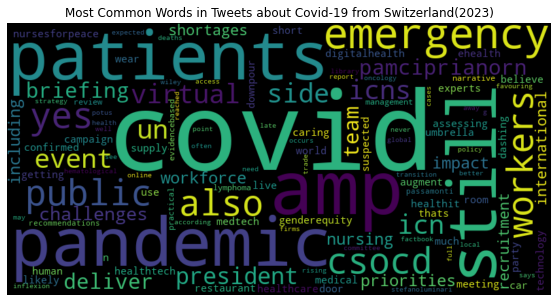

In [ ]:
che_df_new = df_new.loc[df_new.user_location=="Switzerland"]
# Remove stop words and calculate the frequency of the words
stop_words = nltk.corpus.stopwords.words('english')
all_words = ' '.join(che_df_new['text'].tolist())
words = nltk.word_tokenize(all_words)
words = [word.lower() for word in words if word.isalpha() and word.lower() not in stop_words]
fdist = nltk.FreqDist(words)

# Plot the word cloud of the most common words
wordcloud = WordCloud(width=800, height=400).generate_from_frequencies(fdist)
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.title('Most Common Words in Tweets about Covid-19 from Switzerland(2023)')
plt.show()

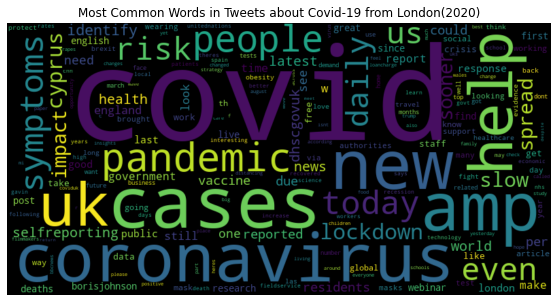

In [ ]:
london_df = df.loc[df.user_location=="London"]
# Remove stop words and calculate the frequency of the words
stop_words = nltk.corpus.stopwords.words('english')
all_words = ' '.join(london_df['text'].tolist())
words = nltk.word_tokenize(all_words)
words = [word.lower() for word in words if word.isalpha() and word.lower() not in stop_words]
fdist = nltk.FreqDist(words)

# Plot the word cloud of the most common words
wordcloud = WordCloud(width=800, height=400).generate_from_frequencies(fdist)
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.title('Most Common Words in Tweets about Covid-19 from London(2020)')
plt.show()

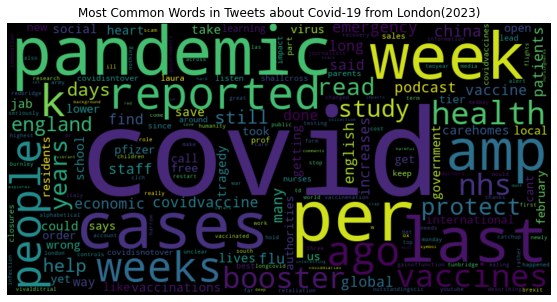

In [ ]:
london_df_new = df_new.loc[df_new.user_location=="London"]
# Remove stop words and calculate the frequency of the words
stop_words = nltk.corpus.stopwords.words('english')
all_words = ' '.join(london_df_new['text'].tolist())
words = nltk.word_tokenize(all_words)
words = [word.lower() for word in words if word.isalpha() and word.lower() not in stop_words]
fdist = nltk.FreqDist(words)

# Plot the word cloud of the most common words
wordcloud = WordCloud(width=800, height=400).generate_from_frequencies(fdist)
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.title('Most Common Words in Tweets about Covid-19 from London(2023)')
plt.show()

These plots show that the most frequent word in tweets published in these locations in both the 2020 and 2023 datasets is “Covid”. This states that the discussion of the covid has been very high among users in the past three years. This also gives us a positive signal that our 2020 and 2023 datasets are both COVID-related, ensuring that our future epidemic sentiment analysis will not go off-topic.

More specifically, although they are all related to COVID, a closer look brings that there are some light differences between the common words of 2020 and 2023. In 2020, in addition to “covid”, the more common words in these locations in tweets were “death”, “growth”, and “lockdown”. But in 2023, in addition to “covid”, the more common words in tweets become “vaccine” and “health”. From the changes in common words, we can predict that people’s attitude toward COVID-19 in 2020 was extremely negative, but now in 2023, due to the development of vaccines, people have become less anxious about the covid. 

### Hashtag Analysis

In this analysis, we are trying to investigate the number of hashtags per tweet and the most common hashtag. The number of hashtags per tweet is a simple way to determine whether or not the tweets we have collected are analytically valuable. Usually, tweets should have one to two hashtags to make the content of the tweet more specific.

Similar to the previous analysis, we plotted the number of hashtags per tweet and the common hashtags in 2020 and 2023 respectively.

In [ ]:
def plot_features_distribution(features, title, df, isLog=False):
    plt.figure(figsize=(12,6))
    plt.title(title)
    for feature in features:
        if(isLog):
            sns.distplot(np.log1p(df[feature]),kde=True,hist=False, bins=120, label=feature)
        else:
            sns.distplot(df[feature],kde=True,hist=False, bins=120, label=feature)
    plt.xlabel('')
    plt.xticks([0, 1, 2, 3, 4, 5,6,7,8,9,10])
    plt.legend()
    plt.show()

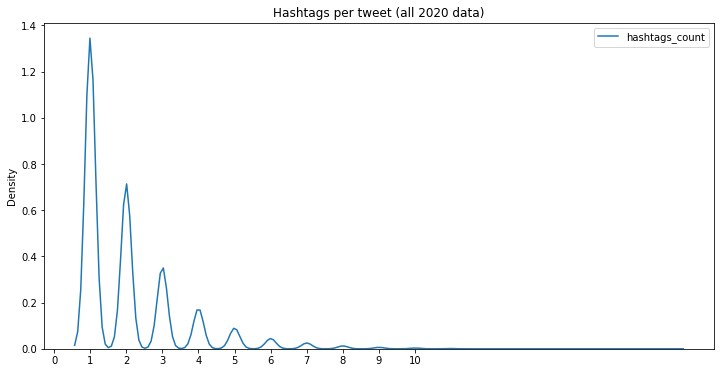

In [ ]:
df['hashtags'] = df['hashtags'].replace(np.nan, "['None']", regex=True)
df['hashtags'] = df['hashtags'].apply(lambda x: x.replace('\\N',''))
df['hashtags_count'] = df['hashtags'].apply(lambda x: len(x.split(',')))
plot_features_distribution(['hashtags_count'], 'Hashtags per tweet (all 2020 data)',df)

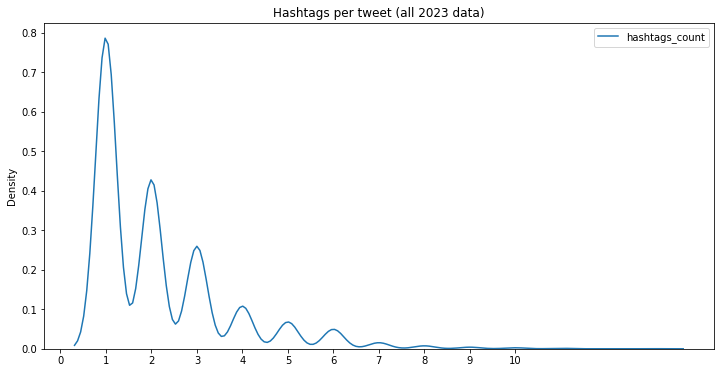

In [ ]:
df_new['hashtags'] = df_new['hashtags'].replace(np.nan, "['None']", regex=True)
df_new['hashtags'] = df_new['hashtags'].apply(lambda x: x.replace('\\N',''))
df_new['hashtags_count'] = df_new['hashtags'].apply(lambda x: len(x.split(',')))
plot_features_distribution(['hashtags_count'], 'Hashtags per tweet (all 2023 data)',df_new)

In [ ]:
df['hashtags_individual'] = df['hashtags'].apply(lambda x: x.split(','))
from itertools import chain
all_hashtags = set(chain.from_iterable(list(df['hashtags_individual'])))
print(f"There are totally: {len(all_hashtags)}")

There are totally: 48803


In [ ]:
df_new['hashtags_individual'] = df_new['hashtags'].apply(lambda x: x.split(','))
from itertools import chain
all_hashtags = set(chain.from_iterable(list(df_new['hashtags_individual'])))
print(f"There are totally: {len(all_hashtags)}")

There are totally: 7055


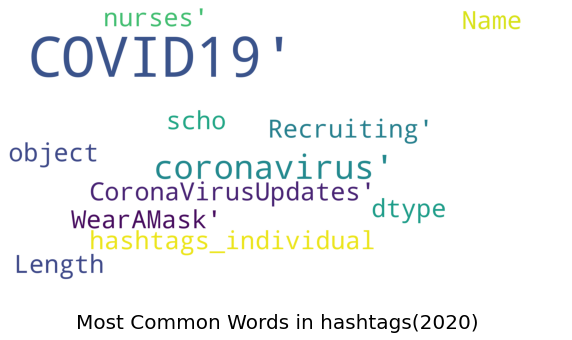

In [ ]:
from wordcloud import STOPWORDS
stopwords = set(STOPWORDS)

def show_wordcloud(data, title = None):
    wordcloud = WordCloud(
        background_color='white',
        stopwords=stopwords,
        max_words=50,
        max_font_size=40, 
        scale=5,
        random_state=1
    ).generate(str(data))

    fig = plt.figure(1, figsize=(10,10))
    plt.axis('off')
    if title: 
        fig.suptitle(title, fontsize=20)
        fig.subplots_adjust(top=2.3)

    plt.imshow(wordcloud)
    plt.show()

show_wordcloud(df['hashtags_individual'], title = 'Most Common Words in hashtags(2020)')

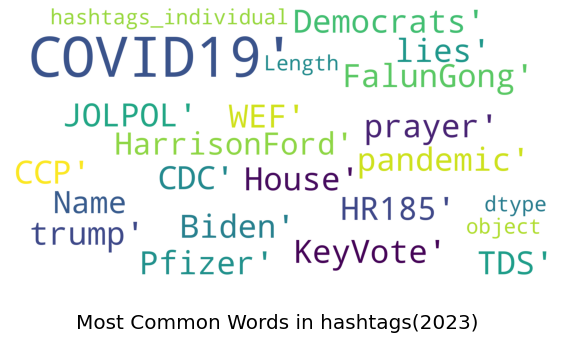

In [ ]:
from wordcloud import STOPWORDS
stopwords = set(STOPWORDS)

def show_wordcloud(data, title = None):
    wordcloud = WordCloud(
        background_color='white',
        stopwords=stopwords,
        max_words=50,
        max_font_size=40, 
        scale=5,
        random_state=1
    ).generate(str(data))

    fig = plt.figure(1, figsize=(10,10))
    plt.axis('off')
    if title: 
        fig.suptitle(title, fontsize=20)
        fig.subplots_adjust(top=2.3)

    plt.imshow(wordcloud)
    plt.show()
show_wordcloud(df_new['hashtags_individual'], title = 'Most Common Words in hashtags(2023)')

These plots exhibit that most of the tweets we collected in 2020 and 2023 contained one or two hashtags, and the most frequent hashtag was “COVID19”, proving once again that our datasets are analyzable. 

### Verified Account Analysis

#### Pie Chart of Verified vs. Non-verified Accounts

We are curious to see how many tweets about Covid19 are coming from credible sources. From the pie charts below, we could observe that in 2020, only 16.1% of the accounts are verified, and even lower percentage, 13.1% in 2023. The majority of accounts are not verified. Non-verified accounts tend to post more biased tweets since they could pretend to be an "anonymous stranger" online.

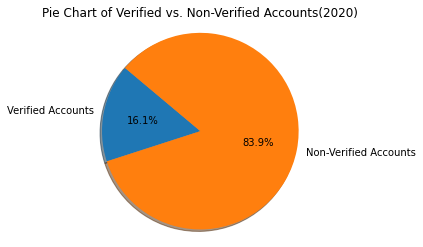

In [ ]:
# Pie chart of verified vs. non-verified accounts
verified_tweets = df[df['user_verified'] == True]['text'].count()
non_verified_tweets = df[df['user_verified'] == False]['text'].count()
labels = ['Verified Accounts', 'Non-Verified Accounts']
sizes = [verified_tweets, non_verified_tweets]
plt.pie(sizes, labels=labels, autopct='%1.1f%%', shadow=True, startangle=140)
plt.axis('equal')
plt.title('Pie Chart of Verified vs. Non-Verified Accounts(2020)')
plt.show()


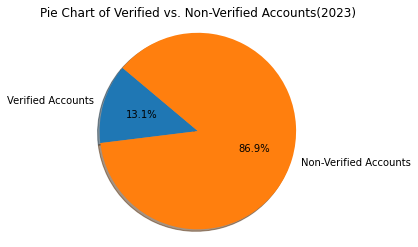

In [ ]:
# Pie chart of verified vs. non-verified accounts
verified_tweets = df_new[df_new['user_verified'] == True]['text'].count()
non_verified_tweets = df_new[df_new['user_verified'] == False]['text'].count()
labels = ['Verified Accounts', 'Non-Verified Accounts']
sizes = [verified_tweets, non_verified_tweets]
plt.pie(sizes, labels=labels, autopct='%1.1f%%', shadow=True, startangle=140)
plt.axis('equal')
plt.title('Pie Chart of Verified vs. Non-Verified Accounts(2023)')
plt.show()

### Scatter plot to see the relationship between the number of followers and the number of friends

We created scatter plots to check if there is a relationship between the number of friends and the number of followers. By letting the x-axis represent the number of followers and the y-axis represent the number of friends, we could see that there does not seem to have a relationship between the two variables for either 2020 or 2023.

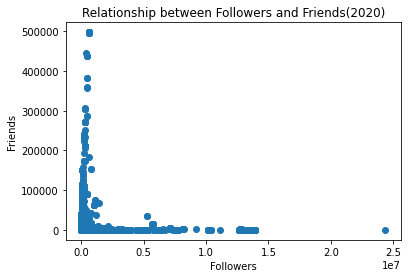

In [ ]:
# Create a scatter plot to see the relationship between the number of followers and the number of friends
plt.scatter(df['user_followers'], df['user_friends'])
plt.xlabel('Followers')
plt.ylabel('Friends')
plt.title('Relationship between Followers and Friends(2020)')
plt.show()



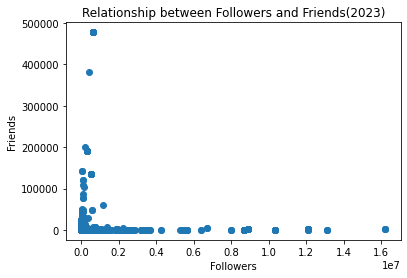

In [ ]:
# Create a scatter plot to see the relationship between the number of followers and the number of friends
plt.scatter(df_new['user_followers'], df_new['user_friends'])
plt.xlabel('Followers')
plt.ylabel('Friends')
plt.title('Relationship between Followers and Friends(2023)')
plt.show()

### Time Variation

We are interested in the post trend to see if people tend to post more tweets on some days. From the time-series plots below, we could see in 2020, two obvious peaks were on 2020-7-25 and 2020-8-22. In 2023, a lower point is on 2023-2-05. 

In [ ]:
df['datedt'] = pd.to_datetime(df['date'])
df['date_only'] = df['datedt'].dt.date
agg_df = df.groupby(["date_only"])["text"].count().reset_index()
agg_df.columns = ["date_only", "numbef of tweets"]

In [ ]:
df_new['datedt'] = pd.to_datetime(df_new['date'])
df_new['date_only'] = df_new['datedt'].dt.date
agg_df_new = df_new.groupby(["date_only"])["text"].count().reset_index()
agg_df_new.columns = ["date_only", "numbef of tweets"]

In [ ]:
def plot_time_variation(df, x='date_only', y='numbef of tweets', hue=None, size=1, title="", is_log=False):
    f, ax = plt.subplots(1,1, figsize=(4*size,3*size))
    g = sns.lineplot(x=x, y=y, hue=hue, data=df)
    plt.xticks(rotation=90)
    if hue:
        plt.title(f'{y} grouped by {hue} | {title}')
    else:
        plt.title(f'{y} | {title}')
    if(is_log):
        ax.set(yscale="log")
    ax.grid(color='black', linestyle='dotted', linewidth=0.75)
    plt.show() 



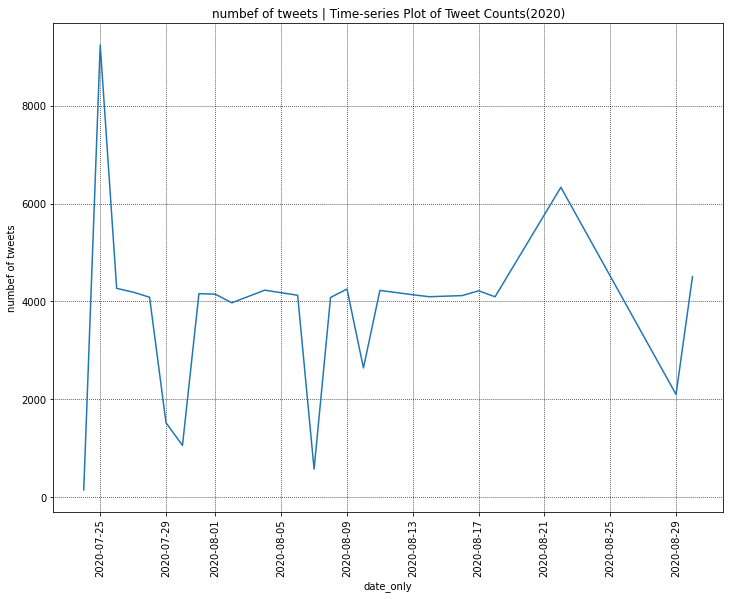

In [ ]:
plot_time_variation(agg_df, title="Time-series Plot of Tweet Counts(2020)",size=3)

From checking the timeline posted by Centers for Disease Control and Prevention (CDC), we know that on 2020-7-16, "Many states, including California, Michigan, and Indiana postpone re-opening plans as COVID-19 case numbers rise." On that day, the U.S. reports a record of 75,600 new cases. On 2020-7-22, "the Department of Defense (DOD) and HHS reach a deal with Pfizer BioNTech for the delivery and distribution of 100 million doses of the Pfizer BioNTech COVID-19 vaccine candidate in December 2020, upon confirmation that the vaccine is safe and effective." On 2020-7-23, "CDC releases resources for school administrators, teachers, parents, guardians, and caregivers to help build appropriate public health strategies to slow the spread of COVID-19 in a school environment." There is no special events or festivals on 2020-7-25.

On 2020-8-19, "after CDC studies show that American Indians and Alaska Natives are among the racial and ethnic minority group at higher risk for severe COVID-19 outcomes, CDC provides more that $200 million in COVID-19 funding to Indian Country." On 2020-8-22, "a study published by the Journal of the American Medical Association calls into question the clinical benefits of the anti-viral drug Remdesivir being used to treat patients hospitalized with COVID-19." These events could be the reason for the second peak.

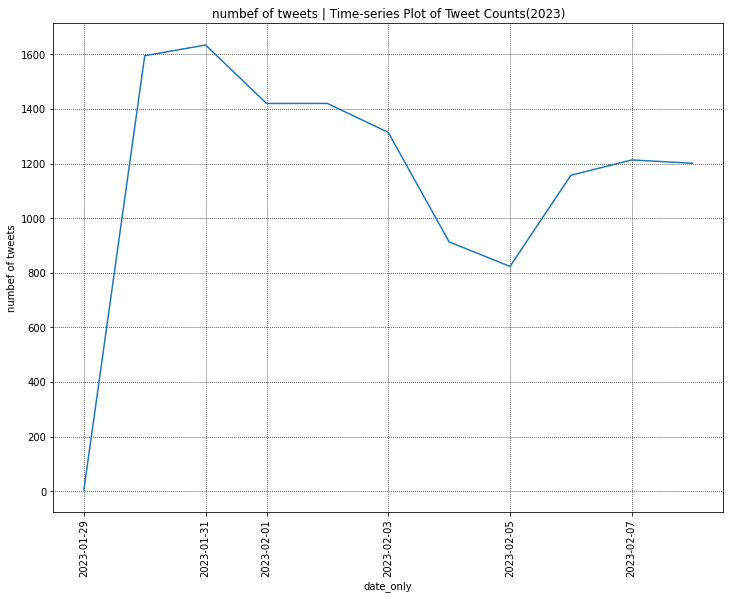

In [ ]:
plot_time_variation(agg_df_new, title="Time-series Plot of Tweet Counts(2023)",size=3)

Because we only have ten days' record, the plot does not show any obvious peak. It only shows a lower point on 2023-2-5, but there does not seem to have any big event on that day globally.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Summary and Future Work:


In this module, we use Kaggle's 2020 data and 2023 data obtained by ourselves to clean, analyze and compare them to help us conduct sentiment analysis later. We have repeatedly demonstrated the availability of our data. In the process, we discover that the most frequently tweeted word in the 2020 and 2023 data sets was "Covid." This indicates a very high level of user discussion on COVID-19 over the past three years, i.e. our 2020 and 2023 data sets are both COVID related, so this positive signal ensures that our future pandemic sentiment analysis stays on topic. Beyond that, we also found some subtle differences between common words used in 2020 and 2023. In 2020, other than "COVID-19," the more common words in tweets for those positions were "death," "growth," and "lockdown." But by 2023, in addition to "COVID-19," the more common words in tweets had become "vaccine" and "health." People are moving from fearing COVID-19 to fighting it with a vaccine. As attitudes improved and death rates dropped with the advent of vaccines, the topics and key words of discussion changed. Later, we also tried to investigate the number of hashtags per tweet and the most common hashtags. We speculate that tweets with one or two hashtags will be more specific in their content. At the same time, we also noticed that about 13% of users were unwilling to authenticate their Twitter account in either 2020 or 2023. Finally, we also identified the peaks and troughs of covid tweets in July and August 2020 and mid-February 2023, respectively, and we used the news at that time to guess the reasons for the peaks and troughs in comments.

While there are some limitations to our data, such as differences in user location and time zone, and the fact that Twitter does not cover all users and regions, ignoring these factors allows us to gain insight into public perceptions of Covid-19 and its evolution over time, and enable policymakers to explore this information in meaningful ways.

In the next step, we hope to perform sentiment analysis on COVID-19 tweet data set based on this, and select and apply appropriate models and methods to achieve the goal of sentiment analysis. In addition, we will select the best model based on performance and validation metrics, and explain why the models chosen and their limitations. Finally, we will adjust the model to optimize its performance as well as evaluate the performance of the model and measure the results using appropriate metrics.